## 08. PyTorch Paper Replicating

- https://www.learnpytorch.io/08_pytorch_paper_replicating/

여기서는 vision transformer 연구 논문을 실습

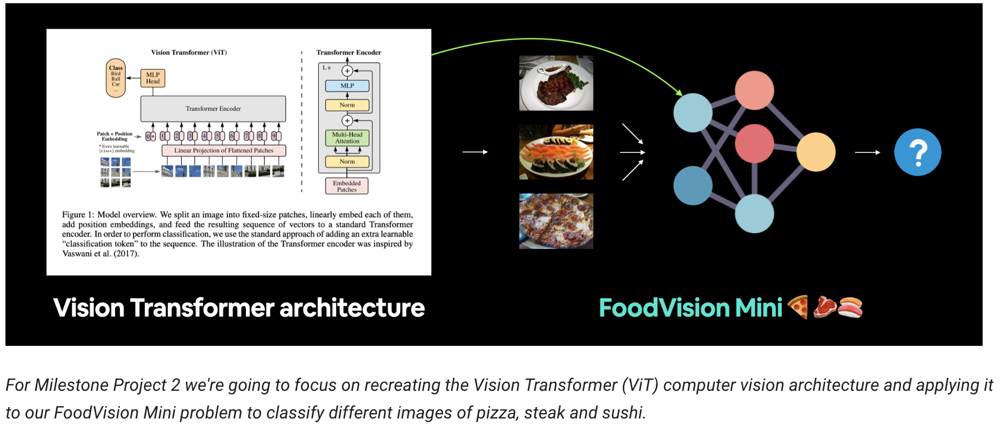

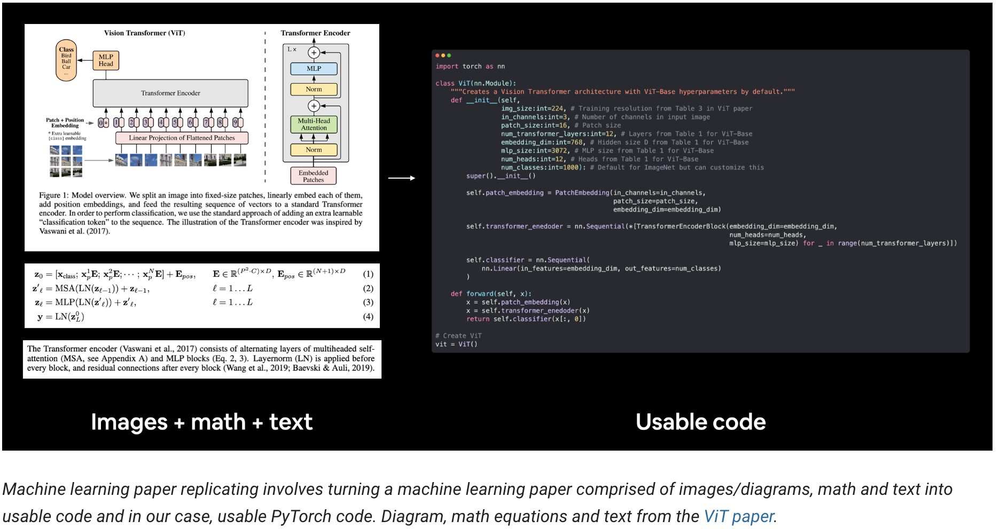

Where can you find code examples for machine learning research papers?

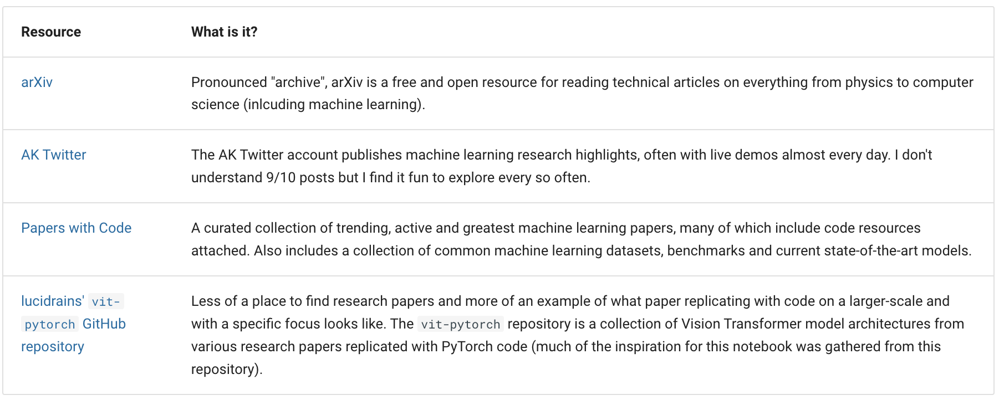

- https://github.com/lucidrains/vit-pytorch

논문을 복제하는 것에 대해 이야기하는 대신 실제로 논문을 복제해 보겠습니다.

모든 논문을 복제하는 과정은 조금씩 다르겠지만, 한 논문을 복제하는 것이 어떤 것인지 확인함으로써 더 많은 논문을 복제할 수 있는 원동력을 얻을 수 있을 것입니다.  

좀 더 구체적으로, 머신러닝 연구 논문인 '이미지가 16x16 단어의 가치가 있다'를 복제할 예정입니다: 대규모 이미지 인식을 위한 트랜스포머(PyTorch를 사용한 대규모 이미지 인식을 위한 트랜스포머(ViT 논문)).  

트랜스포머 신경망 아키텍처는 원래 머신 러닝 연구 논문 Attention is all you need에서 소개되었습니다.  

그리고 원래 Transformer 아키텍처는 1차원(1D) 텍스트 시퀀스에서 작동하도록 설계되었습니다.  

트랜스포머 아키텍처는 일반적으로 어텐션 메커니즘을 사용하는 모든 신경망을 기본 학습 계층으로 간주합니다. 컨볼루션 신경망(CNN)이 컨볼루션을 기본 학습 계층으로 사용하는 방식과 유사합니다. 

이름에서 알 수 있듯이, 비전 트랜스포머(ViT) 아키텍처는 원래의 트랜스포머 아키텍처를 비전 문제에 맞게 조정하기 위해 설계되었습니다(분류가 최초이며 이후 많은 다른 분류가 뒤따랐습니다).  

오리지널 비전 트랜스포머는 지난 몇 년 동안 여러 번의 반복을 거쳤지만, 여기서는 '바닐라 비전 트랜스포머'로 알려진 오리지널을 복제하는 데 초점을 맞출 것입니다. 원작을 재현할 수 있다면 다른 작품에도 적용할 수 있기 때문입니다.  

우리는 원본 ViT 문서에 따라 ViT 아키텍처를 구축하고 이를 FoodVision Mini에 적용하는 데 집중할 것입니다.

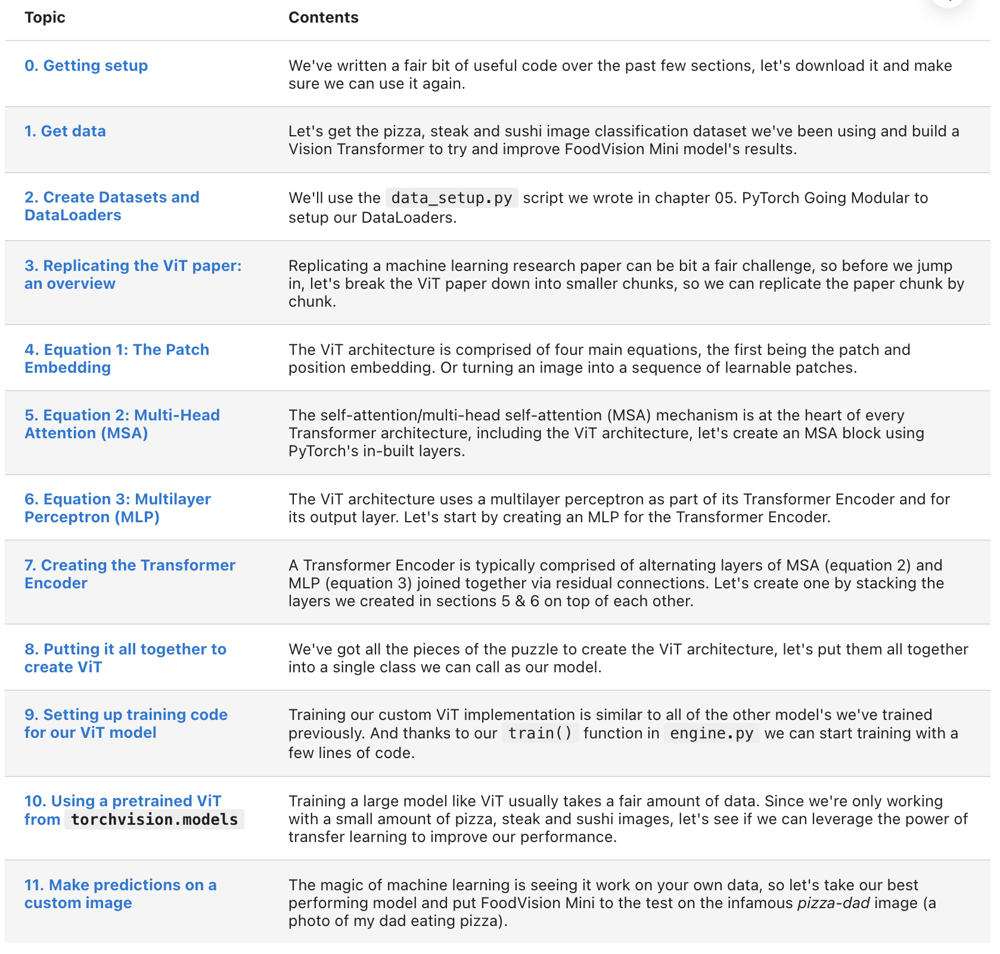

In [1]:
import os
import matplotlib.pyplot as plt
import torch
import torchvision

from torch import nn
from torchvision import transforms

from torchinfo import summary

from going_modular import data_setup, engine
from helper_functions import download_data, set_seeds, plot_loss_curves

/Users/sguys99/anaconda3/envs/torch/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cpu'

In [3]:
device = "mps" if torch.backends.mps.is_available() else "cpu"
device

'mps'

### 1. Get Data

In [4]:
# Download pizza, steak, sushi images from GitHub
image_path = download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip",
                           destination="pizza_steak_sushi")
image_path

[INFO] data/pizza_steak_sushi directory exists, skipping download.


PosixPath('data/pizza_steak_sushi')

In [5]:
os.listdir(image_path)

['test', 'train']

In [6]:
# Setup directory paths to train and test images
train_dir = image_path / "train"
test_dir = image_path / "test"

### 2. Create Datasets and Dataloaders

이제 데이터가 생겼으니 이제 데이터를 DataLoader의 데이터로 전환해 보겠습니다.  
이를 위해 data_setup.py의 create_dataloaders() 함수를 사용할 수 있습니다.  
먼저 이미지를 준비하기 위해 트랜스폼을 생성합니다.  
여기에서 ViT 백서에 대한 첫 번째 참조 중 하나가 들어옵니다.  
표 3에서 학습 해상도는 224(높이=224, 너비=224)로 언급되어 있습니다.

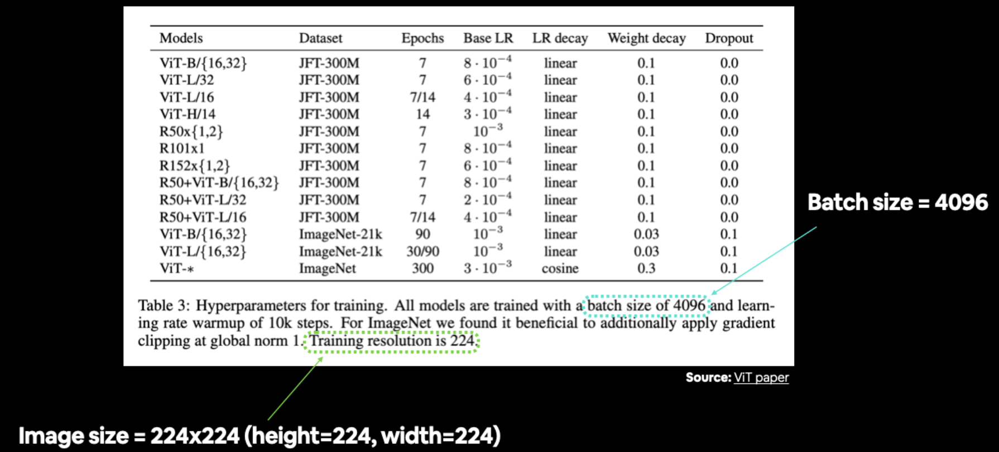

표에 다양한 하이퍼파라미터 설정이 나열되어 있는 경우가 많습니다. 이 경우에는 아직 데이터를 준비 중이므로 주로 이미지 크기 및 배치 크기와 같은 항목에 중점을 두고 있습니다. 출처: ViT 백서의 표 3.

따라서 트랜스폼이 이미지 크기를 적절하게 조정하도록 하겠습니다.

그리고 처음부터 모델을 훈련할 것이므로(처음부터 전이 학습을 하지 않을 것입니다), 06에서 했던 것처럼 정규화 트랜스폼을 제공하지 않을 것입니다. 파이토치 전이 학습 섹션 2.1을 참고하세요.

#### 2.1 Prepare transforms for images

In [7]:
# Create image size (from Table 3 in the ViT paper) 
IMG_SIZE = 224

# Create transform pipeline manually
manual_transforms = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
])           
print(f"Manually created transforms: {manual_transforms}")

Manually created transforms: Compose(
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=warn)
    ToTensor()
)


#### 2.2 Turn images into DataLoader's

이제 DataLoader를 생성할 차례다.  
논문에는 우리가 사용하던 배치 32의 128배인 4096을 사용한다고 했다.  
하지만 여기서는 32를 사용한다.  
4096은 매우 크기 때문이다.


이제 데이터로더를 만들어 보겠습니다.  
ViT 백서에는 우리가 사용하던 배치 크기(32)의 128배인 4096의 배치 크기를 사용한다고 명시되어 있습니다.  
하지만 여기서는 배치 크기 32를 고수하겠습니다.  

일부 하드웨어(Google Colab의 무료 티어 포함)는 배치 크기 4096을 처리하지 못할 수 있기 때문입니다.
배치 크기가 4096이라는 것은 한 번에 4096개의 이미지를 GPU 메모리에 넣어야 한다는 의미입니다.

이 방법은 Google의 연구팀처럼 하드웨어가 이를 처리할 수 있는 경우에 적합하지만, 단일 GPU에서 실행하는 경우(예: Google Colab 사용)에는 먼저 더 작은 배치 크기로 작동하는지 확인하는 것이 좋습니다.

참고 :   

계산 속도를 높이기 위해 create_dataloaders() 함수에서 pin_memory=True 매개변수를 사용하고 있습니다.  
pin_memory=True는 이전에 보았던 예제를 "고정"하여 CPU와 GPU 메모리 간에 불필요한 메모리 복사를 방지합니다.  
이 옵션의 이점은 데이터 세트 크기가 클수록 더 잘 드러나지만(FoodVision Mini 데이터 세트는 상당히 작습니다).   
그러나 pin_memory=False로 설정한다고 해서 항상 성능이 향상되는 것은 아니므로(머신 러닝에서 어떤 것은 작동하고 어떤 것은 작동하지 않는 시나리오 중 하나입니다) 실험하고, 실험하고, 실험하는 것이 가장 좋습니다.  
자세한 내용은 PyTorch torch.utils.data.DataLoader 문서 또는 Horace He의 '첫 번째 원칙에서 딥 러닝을 시작하기(Making Deep Learning Go Brrrr)'를 참조하세요.

In [8]:
BATCH_SIZE = 32

train_dataloader, test_dataloader, class_names = data_setup.create_dataloaders(
    train_dir=train_dir,
    test_dir = test_dir,
    transform = manual_transforms,
    batch_size=BATCH_SIZE
)

train_dataloader, test_dataloader, class_names

(<torch.utils.data.dataloader.DataLoader at 0x1056b50f0>,
 ['pizza', 'steak', 'sushi'])

#### 2.3 Visualize a single image

ViT 문서에서 중요한 단계는 이미지를 패치로 준비하는 것입니다.

이것이 무엇을 의미하는지 섹션 4에서 살펴보겠지만, 지금은 하나의 이미지와 그 레이블을 살펴보겠습니다.

이를 위해 데이터 배치에서 단일 이미지와 레이블을 가져와서 그 모양을 살펴보겠습니다.

In [9]:
image_batch, label_batch = next(iter(train_dataloader))

image, label = image_batch[0], label_batch[0]

image.shape, label

(torch.Size([3, 224, 224]), tensor(2))

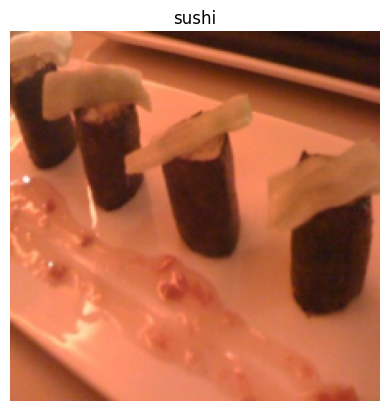

In [10]:
plt.imshow(image.permute(1, 2, 0)) # dimension 재배치
plt.title(class_names[label])
plt.axis(False);

### 3. Replicating the ViT paper: an overview

코드를 더 작성하기 전에 우리가 무엇을 하고 있는지 논의해 보겠습니다.   
우리는 우리 자신의 문제인 FoodVision Mini에 대해 ViT 논문을 복제하려고 합니다.  
모델 입력은 피자, 스테이크, 스시 이미지입니다.   
그리고 이상적인 모델 출력은 피자, 스테이크, 초밥의 예상 라벨입니다.   
이전 섹션에서 수행한 작업과 다르지 않습니다.   
문제는 입력에서 원하는 출력으로 어떻게 이동하느냐는 것입니다.  

#### 3.1 Inputs and outputs, layers and blocks

ViT는 딥러닝 신경망 아키텍처입니다.  
그리고 모든 신경망 아키텍처는 일반적으로 레이어로 구성됩니다.  
그리고 레이어의 집합을 흔히 블록이라고 합니다.   
그리고 여러 블록을 쌓아 올리면 전체 아키텍처가 완성됩니다.  
레이어는 입력(예: 이미지 텐서)을 받아 어떤 종류의 함수(예: 레이어의 forward() 메서드에 있는 것)를 수행한 다음 출력을 반환합니다.  
따라서 단일 레이어가 입력을 받아 출력을 제공한다면 레이어 모음이나 블록도 입력을 받아 출력을 제공합니다.  
이를 구체적으로 살펴봅시다:  


- 레이어 : 입력을 받아 함수를 수행한 후 출력을 반환합니다.
- 블록 : 레이어의 모음으로, 입력을 받고 일련의 함수를 수행한 후 출력을 반환합니다.
- 아키텍처(또는 모델) : 블록의 모음으로, 입력을 받아 일련의 함수를 수행한 후 출력을 반환합니다.

이 개념은 우리가 ViT 논문을 복제하는 데 사용할 것입니다.

레이어별로, 블록별로, 함수 별로 퍼즐 조각을 레고처럼 조립하여 원하는 전체 아키텍처를 만들 것입니다.

이렇게 하는 이유는 전체 연구 논문을 보는 것이 부담스러울 수 있기 때문입니다.

따라서 이해를 돕기 위해 단일 레이어의 입력과 출력부터 시작하여 전체 모델의 입력과 출력까지 세분화하여 살펴보겠습니다.

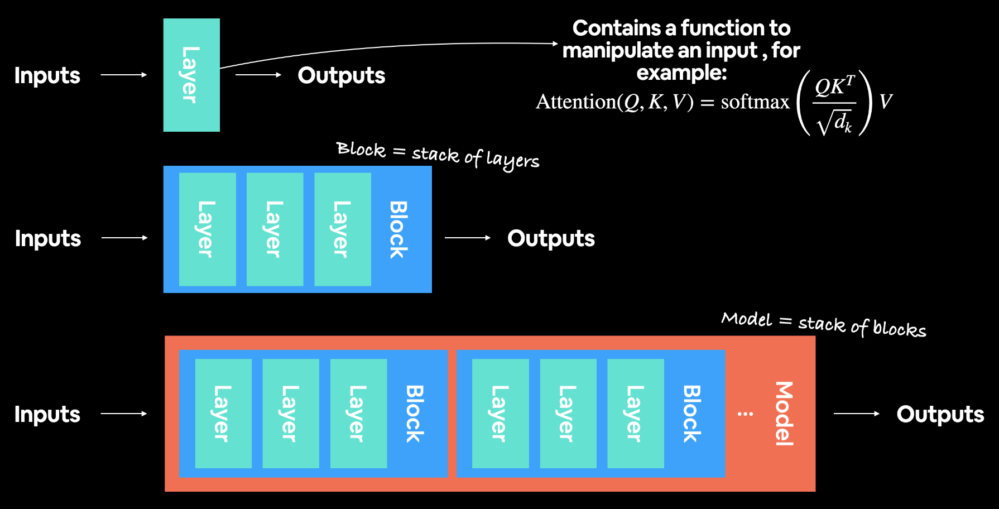

- 최신 딥러닝 아키텍처는 일반적으로 레이어와 블록의 집합입니다. 
- 레이어는 입력(수치로 표현된 데이터)을 받아 일종의 함수(예: 위 그림의 자기 주의 공식)를 사용하여 조작한 다음 를 출력합니다.   
- 블록은 일반적으로 단일 레이어와 유사한 작업을 여러 번 수행하는 레이어를 서로 겹쳐서 쌓은 것입니다.

#### 3.2 Getting specific: What's ViT made of?

이 백서 곳곳에 ViT 모델에 대한 작은 세부 사항이 많이 있습니다.  
이 모든 것을 찾는 것은 마치 하나의 커다란 보물찾기와 같습니다!  
연구 논문은 수개월에 걸친 작업이 몇 페이지로 압축된 경우가 많으므로 이를 복제하는 데 연습이 필요한 것은 이해할 수 있습니다.
하지만 아키텍처 설계를 위해 살펴볼 주요 세 가지 리소스는 다음과 같습니다:

1. Figure 1 : 이것은 그래픽으로 모델의 개요를 제공하며, 이 그림만으로도 아키텍처를 거의 재현할 수 있습니다.
2. Four equations in section 3.1 : 이 방정식은 그림 1의 색깔쳐진 블록에 대한 수학적 근거를 조금 더 제공합니다.
3. Table 1 : 다양한 ViT 모델 변형에 대한 다양한 하이퍼파라미터 설정(예: 레이어 수 및 숨겨진 유닛 수)을 보여줍니다. 여기서는 가장 작은 버전인 ViT-Base에 초점을 맞추겠습니다

3.2.1 Exploring Figure 1    

ViT 백서의 그림 1부터 살펴보겠습니다.

우리가 주목해야 할 주요 사항은 다음과 같습니다:

- 레이어 - 입력을 받고, 입력에 대해 연산 또는 함수를 수행하여 출력을 생성합니다.
- 블록 - 레이어의 모음으로, 역시 입력을 받아 출력을 생성합니다.

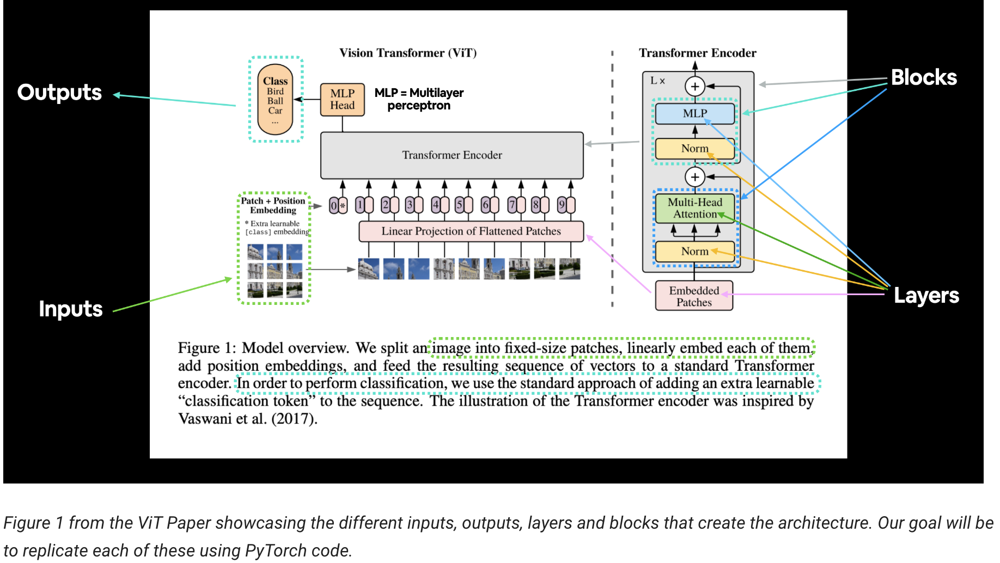

ViT 아키텍처는 몇가지 스테이지로 되어있다.  

- `Patch + Position Embedding (inputs)` : 입력 이미지를 이미지 패치 시퀀스로 변환하고 위치 번호를 추가하여 패치가 들어오는 순서를 지정합니다.  

- `Linear projection of flattened patches (Embedded Patches)` : 이미지 패치가 임베딩으로 변환되며, 이미지 값 대신 임베딩을 사용하면 임베딩이 학습 가능한 이미지 표현(일반적으로 벡터 형태)으로 학습을 통해 개선할 수 있다는 이점이 있습니다.  

- `Norm` - 신경망을 정규화(과적합 감소)하는 기술인 "레이어 정규화" 또는 "레이어 표준"의 줄임말로, PyTorch 레이어 torch.nn.LayerNorm()을 통해 LayerNorm을 사용할 수 있습니다.   

- `Multi-Head Attention` - 멀티 헤드 셀프 어텐션 레이어 또는 줄여서 "MSA"입니다. PyTorch 레이어 torch.nn.MultiheadAttention()을 통해 MSA 레이어를 생성할 수 있습니다.   

- `MLP (or Multilayer perceptron)` : MLP는 종종 피드포워드 레이어 모음(또는 PyTorch의 경우 forward() 메서드가 있는 레이어 모음)을 지칭할 수 있습니다. ViT 백서에서 저자들은 MLP를 "MLP 블록"이라고 부르며, 여기에는 두 개의 torch.nn.Linear() 레이어와 그 사이에 torch.nn.GELU() 비선형성 활성화(섹션 3.1) 및 각 레이어 뒤에 torch.nn.Dropout() 레이어가 포함되어 있습니다(부록 B.1).  

- `Transformer Encoder` : 트랜스포머 인코더는 위에 나열된 레이어의 모음입니다. 트랜스포머 인코더 내부에는 두 개의 스킵 연결("+" 기호)이 있으며, 이는 레이어의 입력이 바로 앞 레이어와 후속 레이어에 직접 공급된다는 의미입니다. 전체 ViT 아키텍처는 여러 개의 트랜스포머 인코더를 겹겹이 쌓아 올린 구조로 구성되어 있습니다.   

- `MLP Head` : 아키텍처의 출력 레이어로, 입력의 학습된 특징을 클래스 출력으로 변환합니다. 이미지 분류 작업을 하기 때문에 '분류기 헤드'라고도 부를 수 있습니다. MLP 헤드의 구조는 MLP 블록과 유사합니다.  

ViT는 기존 파이토치 레이어로 구현할 수 있음을 알수 있다.  


이제 Figure 1을 보고 우리의 문제로 바꿔보자.


3.2.2 Exploring the Four Equations

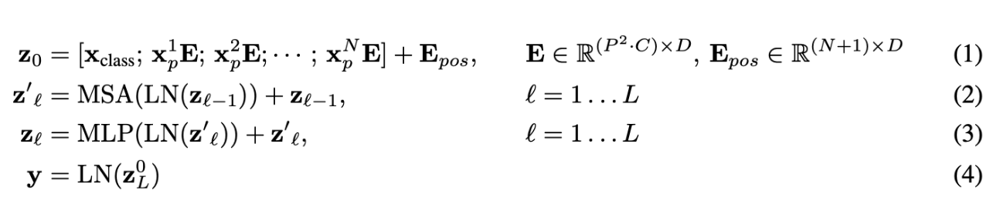

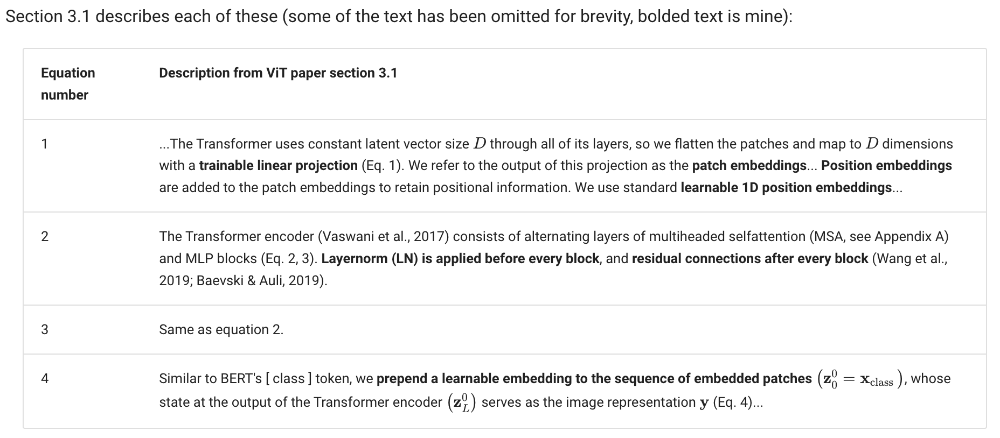

수식에 대한 설명은 다음과 같다.   
- 1: ...트랜스포머는 모든 레이어에서 일정한 잠재 벡터 크기 D를 사용하므로 패치를 평평하게 하고 훈련 가능한 선형 투영을 사용하여 D 차원으로 매핑합니다(방정식 1). 이 투영의 출력을 패치 임베딩이라고 합니다... 위치 정보를 유지하기 위해 패치 임베딩에 위치 임베딩이 추가됩니다. 우리는 표준 학습 가능한 1D 위치 임베딩을 사용합니다...   
- 2: 트랜스포머 인코더(Vaswani et al., 2017)는 멀티헤드 셀프어텐션(MSA, 부록 A 참조)과 MLP 블록(식 2, 3)의 교대 레이어로 구성됩니다. 레이어노름(LN)은 모든 블록 전에 적용되고, 잔여 연결은 모든 블록 후에 적용됩니다(Wang et al., 2019; Baevski & Auli, 2019).  
- 3: 2와 같음
- 4: 버트의 클래스 토큰과 유사하게 임베딩된 패치 시퀀스에 학습 가능한 임배딩을 추가합니다. 따라서 트랜스포어 인코더의 출력은 이미지 representation 역할을 합니다.

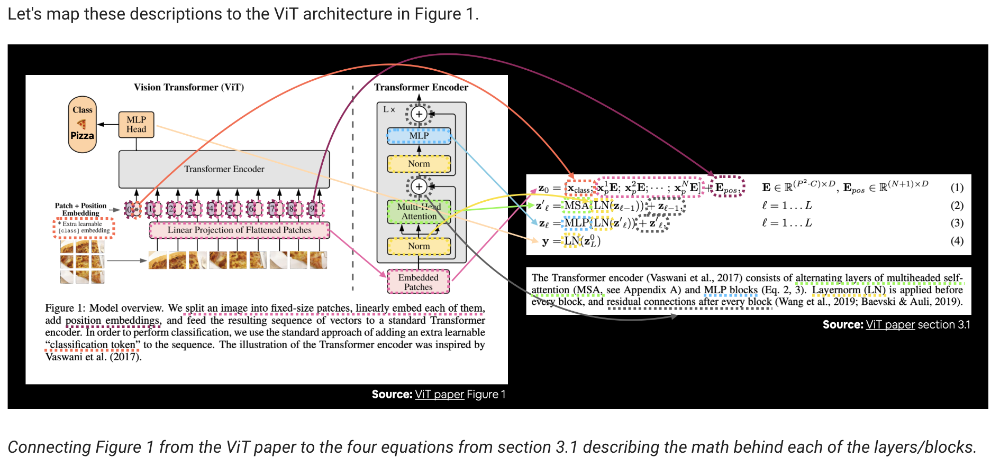

위 이미지에는 많은 일이 일어나고 있지만 색칠된 선과 화살표를 따라가다 보면 ViT 아키텍처의 주요 개념이 드러납니다.
각 방정식을 좀 더 세분화해 보면 어떨까요(코드로 다시 만드는 것이 목표입니다)?

방정식 4를 제외한 모든 방정식에서 "z"는 특정 레이어의 원시 출력입니다:
- z0 는 임베딩 레이어의 초기 패치이다.  
- z`l 는 z의 중간 값이다.  
- zl는 특정레이어의 z   

y는 아키텍처의 전체 출력이다.

3.2.3 Equation 1 overview

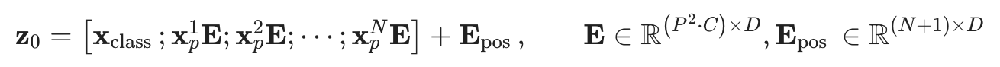

z0은 클래스 토큰, 패치임배딩, 포지션 임베딩을 다루는 부분이다.   

벡터폼은 다음과 같다.  


x_input = [class_token, image_patch_1, image_patch_2, image_patch_3...] + [class_token_position]  
각 요소는 학습 가능해야한다.(requries_grad = True)

3.2.4 Equation 2 overview

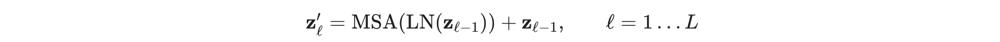

즉, 1부터 L(레이어의 총 개수)까지의 모든 레이어에 대해 레이어노름 레이어(LN)를 감싸는 다중 헤드 어텐션 레이어(MSA)가 있습니다.

끝에 추가되는 것은 출력에 입력을 추가하고 건너뛰기/잔여 연결을 형성하는 것과 같습니다.

이 레이어를 "MSA 블록"이라고 부르겠습니다. 

코드로는 다음과 같이 보일 수 있습니다:

x_output_MSA_block = MSA_layer(LN_layer(x_input)) + x_input

3.2.5 Equation 3 overview

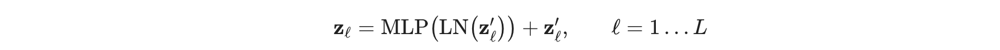

이는 1부터 L(총 레이어 수)까지의 모든 레이어에 대해 레이어노름 레이어(LN)를 감싸는 다층 퍼셉트론 레이어(MLP)가 있다는 것을 의미합니다.

끝에 추가된 것은 skip/residual 연결의 존재를 나타냅니다.

이 레이어를 "MLP 블록"이라고 부르겠습니다.

코드로는 다음과 같이 보일 수 있습니다:

```
x_output_MLP_block = MLP_layer(LN_layer(x_output_MSA_block)) + x_output_MSA_block
```

끝에 있는 skip 연결(레이어의 입력을 레이어의 출력에 추가)에 주목하세요.

3.2.6 Equation 4 overview

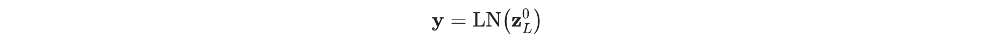

마지막 레이어 L의 경우 출력 y는 LayerNorm 레이어(LN)로 래핑된 z의 0 인덱스 토큰입니다.(0번쨰 인덱스 토큰 값)

또는 우리의 경우 x_output_MLP_block의 0번째 인덱스입니다:

y = Linear_layer(LN_layer(x_output_MLP_block[0]))

물론 위에 몇 가지 단순화된 부분이 있지만 각 섹션에 대한 PyTorch 코드를 작성하기 시작할 때 처리하겠습니다.

참고: 위 섹션은 많은 정보를 다루고 있습니다. 하지만 이해가 되지 않는 부분이 있다면 언제든지 더 조사해볼 수 있다는 것을 잊지 마세요. "잔여 연결이란 무엇인가?"와 같은 질문을 해보세요.

3.2.7 Exploring Table 1

ViT 아키텍처 퍼즐의 마지막 조각은 표 1입니다.

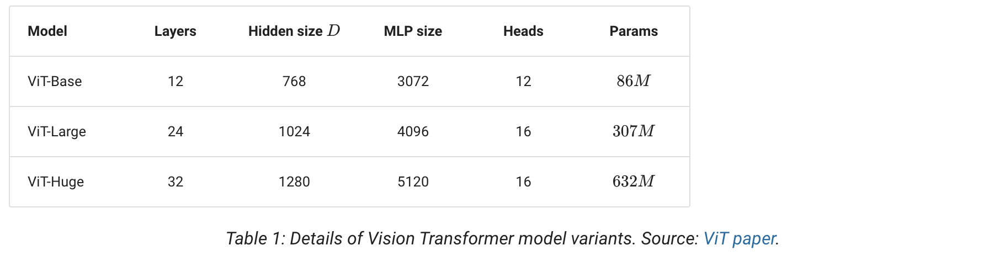

우리는 사이즈가 작은 ViT-Base를 구현할 것이다.

위 테이블에서 각항목이 나타내는 것을 살펴보자.(디코더는 안쓰는 듯)  
- Layers : 인코더 블럭의 수. 각 레이어는 MSA, MLP를 포함한다.
- Hidden size D : 아키텍처의 임베딩 차원이다. 즉 이미지가 패치되어 임베드될 때 이미지가 변환되는 벡터의 크기이다. 일반적으로 임베딩 차원이 클수록 더 많은 정보를 캡쳐할 수있고 더 좋은 결과를 얻을 수 있다. 그러나 임베딩 크기가 크면 더 많은 컴퓨팅 비용이 발생한다.
- MLP size : MLP 레이어에서 히든 유니트의 수
- Heads : 멀티헤드어텐션 레이어에서 히든 레이어의 수
- Params : 모델 파라미터수. ViT-Base 임에도 이전에 본 다른 모델에 비해서 매우 큰 것을 알수있다.

### 4. Equation 1: Split data into patches and creating the class, position and patch embedding

제 머신 러닝 엔지니어 친구 중 한 명이 "임베딩이 전부"이라고 말하곤 했던 것이 기억납니다.

즉, 데이터를 학습 가능한 방식으로 잘 표현할 수 있다면(임베딩은 학습 가능한 표현이므로) 학습 알고리즘이 잘 작동할 가능성이 높다는 뜻입니다.

이제 ViT 아키텍처를 위한 클래스, 위치 및 패치 임베딩을 만드는 것부터 시작하겠습니다.
패치 임베딩부터 시작하겠습니다.

즉, 입력 이미지를 일련의 패치로 전환한 다음 해당 패치를 임베딩할 것입니다.
임베딩은 어떤 형태의 학습 가능한 표현이며 종종 벡터라는 점을 기억하세요.
학습 가능하다는 용어가 중요한 이유는 입력 이미지의 수치적 표현(모델이 보는)이 시간이 지남에 따라 개선될 수 있다는 것을 의미하기 때문입니다.

ViT 백서의 3.1절(굵은 글씨로 표시된 부분)의 첫 문단부터 살펴보겠습니다:

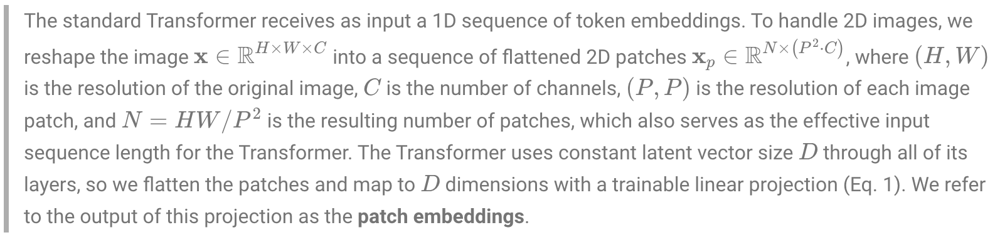

표준 트랜스포머는 토큰 임베딩의 1D 시퀀스를 입력으로 받습니다. 2D 이미지를 다루기 위해, 원본 이미지 X (R_HWC)를 flatten된 2D 패치들의 시퀀스 Xp (R_Nx(P^2C))로 변환한다, $C$는 채널 수, $(P, P)$ 는 각 이미지 패치의 해상도, and $N=H W / P^2$ 는 패치수이며, 트랜스포머 입력 길이에 영향을 미친다. 트랜스포머는 모든 레이어에서 일정한 latent 벡터 크기 $D$를 사용하므로, 패치를 평평하게 하고 훈련 가능한 선형 투영을 사용하여 $D$ 차원으로 매핑합니다(방정식 1). 이 투영의 출력을 패치 임베딩이라고 합니다.

그리고 테이블 3에서 training resolution은 224라고 명시되어 있다.

이제 위 내용을 정리하자.  
- D는 패치 임베딩 사이즈인데, VIT 모델마다 다르다.  
- 이미지 사이즈는 H, W, C  
- 이미지는 2D 패치의 시퀀스로 변환되는데 사이즈는 N * N* $P^2$ C 이다.  
- P, P는 이미지 패치의 레졸루션이다.  
- N = HW /P^2는 패치의 수이다. 입력 시퀀스의 길이가 된다.

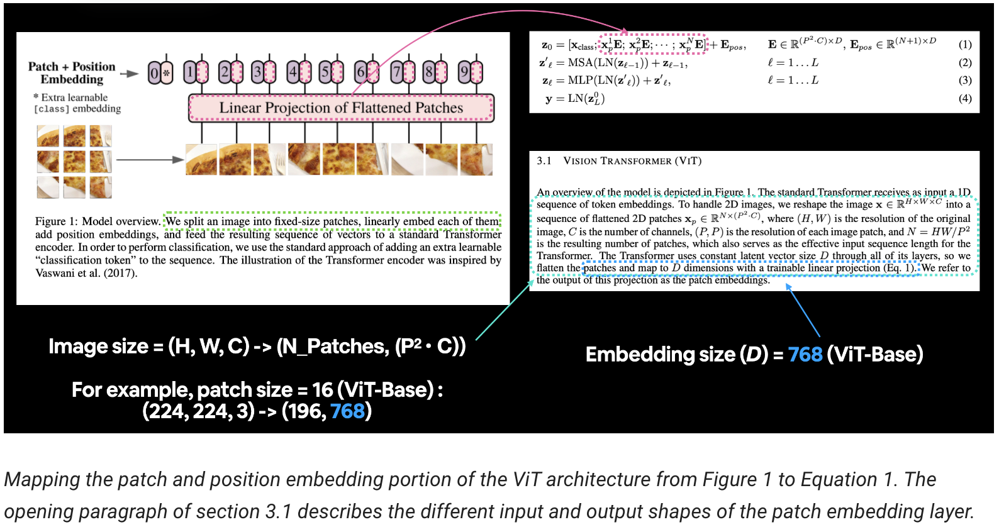

4.1. Calculating patch embedding input and output shapes by hand

이러한 입력 및 출력 도형 값을 직접 계산하는 것부터 시작해보면 어떨까요?  
이를 위해 위의 각 용어(예: H, W 등)를 모방하는 몇 가지 변수를 만들어 보겠습니다.
  
패치 크기(P)는 16을 사용하겠습니다.  
ViT-Base에서 가장 성능이 좋은 버전이기 때문입니다(자세한 내용은 ViT 백서의 표 5의 "ViT B/16" 열 참조).

In [11]:
height = 224 
width = 224
color_channels = 3
patch_size = 16

In [12]:
# Calculate N (number of patches)
number_of_patches = int((height * width) / patch_size**2)
print(f"Number of patches (N) with image height (H={height}), width (W={width}) and patch size (P={patch_size}): {number_of_patches}")

Number of patches (N) with image height (H=224), width (W=224) and patch size (P=16): 196


패치 개수가 정해졌으니 이미지 출력 크기도 만들면 어떨까요?

더 좋은 방법은 패치 임베딩 레이어의 입력 및 출력 모양을 복제하는 것입니다.

기억하세요:  
입력: 이미지가 2D로 시작하며 크기는 HxWxC입니다.  
출력: 이미지가 Nx(P^2xC) 크기의 평평한 2D 패치 시퀀스로 변환됩니다.

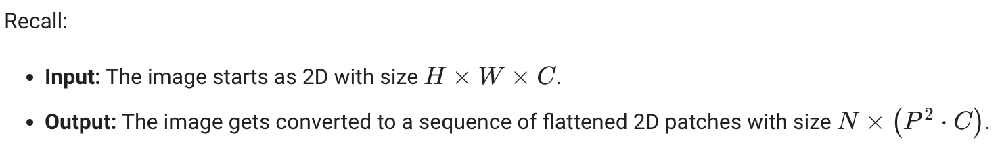

In [13]:
embedding_layer_input_shape = (height, width, color_channels)

embedding_layer_output_shape = (number_of_patches, patch_size**2*color_channels)


print(f"Input shape (single 2D image): {embedding_layer_input_shape}")
print(f"Output shape (single 2D image flattened into patches): {embedding_layer_output_shape}")

Input shape (single 2D image): (224, 224, 3)
Output shape (single 2D image flattened into patches): (196, 768)


4.2 Turning a single image into patches

In [14]:
image.shape

torch.Size([3, 224, 224])

(-0.5, 223.5, 223.5, -0.5)

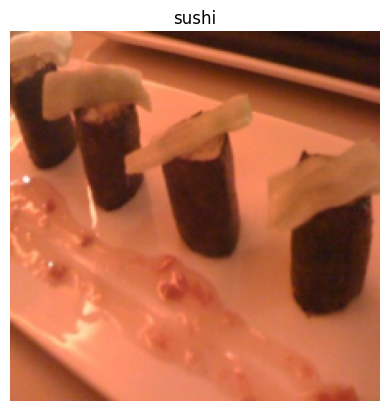

In [15]:
plt.imshow(image.permute(1, 2, 0))
plt.title(class_names[label])
plt.axis(False)

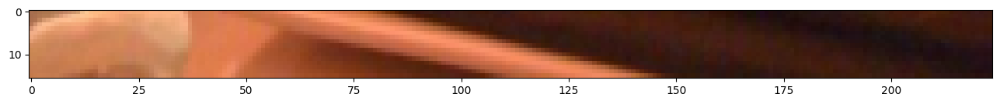

In [16]:
image_permuted = image.permute(1, 2, 0)

patch_size = 16
plt.figure(figsize = (patch_size, patch_size))
plt.imshow(image_permuted[:patch_size, :, :])

- 아래로 16 픽셀까지만

In [17]:
image_permuted.shape

torch.Size([224, 224, 3])

In [18]:
image_permuted[:patch_size, :, :].shape

torch.Size([16, 224, 3])

이제 이 첫번째 row를 패치로 쪼개본다.

Number of patches per row: 14.0
Patch size: 16 pixels x 16 pixels


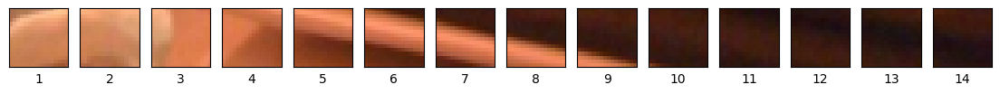

In [19]:
img_size = 224
patch_size = 16
num_patches = img_size / patch_size

assert img_size % patch_size == 0, "Image size must be divisible by patch size"
print(f"Number of patches per row: {num_patches}\nPatch size: {patch_size} pixels x {patch_size} pixels")

fig, axs = plt.subplots(nrows = 1,
                        ncols = img_size // patch_size,
                        figsize = (num_patches, num_patches),
                        sharex = True,
                        sharey = True)

for i, patch in enumerate(range(0, img_size, patch_size)):
    axs[i].imshow(image_permuted[: patch_size, patch: patch+patch_size, :]);
    axs[i].set_xlabel(i + 1)
    axs[i].set_xticks([])
    axs[i].set_yticks([])

Number of patches per row: 14.0        
Number of patches per column: 14.0        
Total patches: 196.0        
Patch size: 16 pixels x 16 pixels


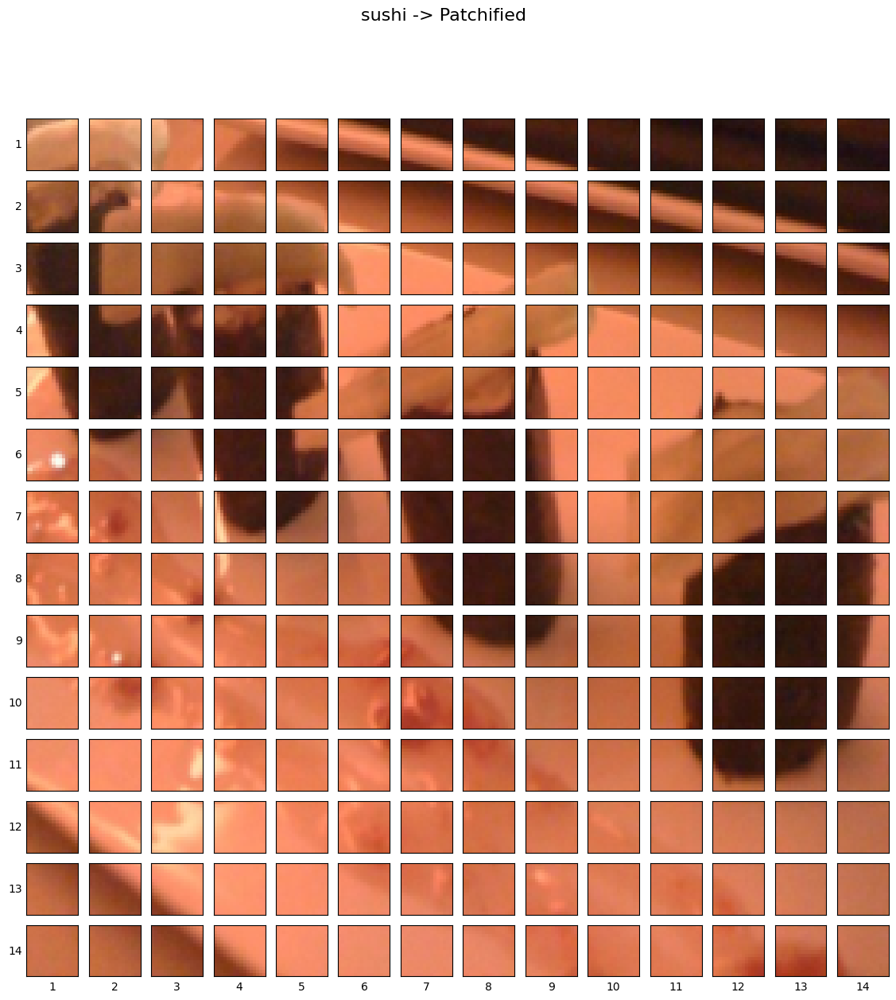

In [20]:
# Setup hyperparameters and make sure img_size and patch_size are compatible
img_size = 224
patch_size = 16
num_patches = img_size/patch_size 
assert img_size % patch_size == 0, "Image size must be divisible by patch size" 
print(f"Number of patches per row: {num_patches}\
        \nNumber of patches per column: {num_patches}\
        \nTotal patches: {num_patches*num_patches}\
        \nPatch size: {patch_size} pixels x {patch_size} pixels")

# Create a series of subplots
fig, axs = plt.subplots(nrows=img_size // patch_size, # need int not float
                        ncols=img_size // patch_size, 
                        figsize=(num_patches, num_patches),
                        sharex=True,
                        sharey=True)

# Loop through height and width of image
for i, patch_height in enumerate(range(0, img_size, patch_size)): # iterate through height
    for j, patch_width in enumerate(range(0, img_size, patch_size)): # iterate through width
        
        # Plot the permuted image patch (image_permuted -> (Height, Width, Color Channels))
        axs[i, j].imshow(image_permuted[patch_height:patch_height+patch_size, # iterate through height 
                                        patch_width:patch_width+patch_size, # iterate through width
                                        :]) # get all color channels
        
        # Set up label information, remove the ticks for clarity and set labels to outside
        axs[i, j].set_ylabel(i+1, 
                             rotation="horizontal", 
                             horizontalalignment="right", 
                             verticalalignment="center") 
        axs[i, j].set_xlabel(j+1) 
        axs[i, j].set_xticks([])
        axs[i, j].set_yticks([])
        axs[i, j].label_outer()

# Set a super title
fig.suptitle(f"{class_names[label]} -> Patchified", fontsize=16)
plt.show()

4.3 Creating image patches with torch.nn.Conv2d()

이미지가 패치로 변환되면 어떻게 보이는지 살펴봤는데, 이제 파이토치로 패치 임베딩 레이어를 복제하는 작업을 시작해 보겠습니다.   

단일 이미지를 시각화하기 위해 단일 이미지의 다양한 높이와 너비 치수를 반복하고 개별 패치를 플롯하는 코드를 작성했습니다.    

이 연산은 03에서 살펴본 컨볼루션 연산과 매우 유사합니다.  
PyTorch 컴퓨터 비전 섹션 7.1에서 살펴본 컨볼루션 연산과 유사합니다:      

실제로 ViT 논문의 저자는 3.1절에서 컨볼루션 신경망(CNN)으로 패치 임베딩을 수행할 수 있다고 언급하고 있습니다:

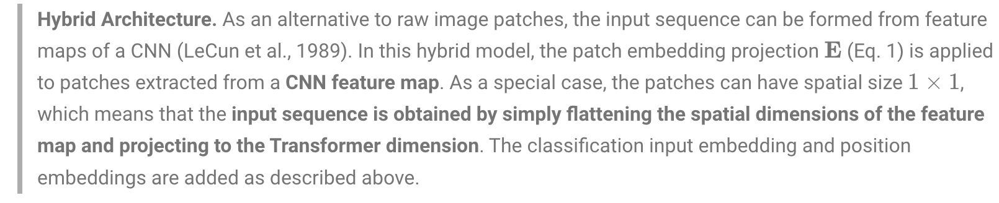

하이브리드 아키텍처.  원시 이미지 패치의 대안으로 입력 시퀀스는 CNN의 피처 맵으로 구성할 수 있습니다(LeCun et al., 1989). 

이 하이브리드 모델에서는 패치 임베딩 투영법 E(식 1)가 CNN 특징 맵에서 추출한 패치에 적용됩니다.  
특수한 경우로 패치는 공간 크기가 1X1일 수 있으며,  
이는 특징 맵의 공간 차원을 평탄화하고 트랜스포머 차원으로 투영하여 입력 시퀀스를 얻을 수 있음을 의미합니다. 
분류 입력 임베딩과 위치 임베딩은 위에서 설명한 대로 추가됩니다.

여기서 말하는 '피처 맵'은 특정 이미지를 통과하는 컨볼루션 레이어가 생성하는 weight/activation을 의미합니다.

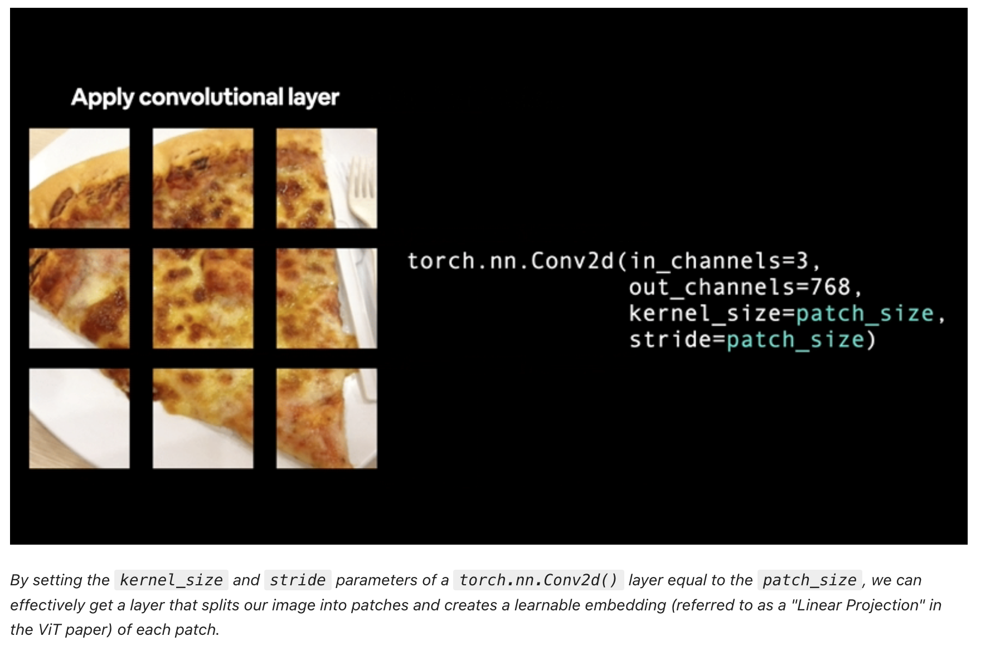

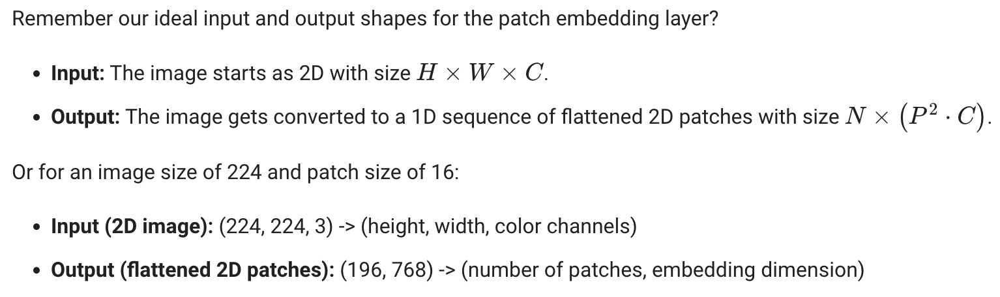

이를 다시 만들 수 있습니다:

- 이미지를 CNN 피처 맵의 패치로 변환하는 torch.nn.Conv2d().  
- 특징 맵의 공간 차원을 평탄화하기 위한 torch.nn.Flatten().   

torch.nn.Conv2d() 레이어부터 시작하겠습니다.  
커널 크기와 stride를 패치 크기와 동일하게 설정하여 패치 생성을 복제할 수 있습니다.  

즉, 각 컨볼루션 커널의 크기는 (패치_크기 x 패치_크기), 또는 패치_크기=16인 경우 (16 x 16)(전체 패치 1개에 해당)이 됩니다.  

그리고 컨볼루션 커널의 각 단계 또는 스텝은 패치 크기 픽셀 길이 또는 16픽셀 길이가 됩니다(다음 패치로 스텝하는 것과 동일).  

 
이미지의 컬러 채널 수에 대해 in_channels=3을 설정하고 ViT-Base의 표 1의 D 값과 동일한 out_channels=768을 설정합니다.  
(임베딩 차원이며, 각 이미지는 768 크기의 학습 가능한 벡터에 임베딩됩니다)

In [21]:
from torch import nn

patch_size = 16

conv2d = nn.Conv2d(in_channels=3,
                   out_channels=768,
                   kernel_size=patch_size,
                   stride=patch_size,
                   padding=0)

(-0.5, 223.5, 223.5, -0.5)

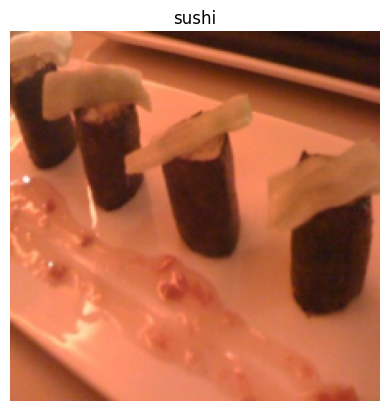

In [22]:
plt.imshow(image.permute(1, 2, 0))
plt.title(class_names[label])
plt.axis(False)

In [23]:
image.shape

torch.Size([3, 224, 224])

In [24]:
image_out_of_conv = conv2d(image.unsqueeze(0))
print(image_out_of_conv.shape)

torch.Size([1, 768, 14, 14])


torch.Size([1, 768, 14, 14]) -> [batch_size, embedding_dim, feature_map_height, feature_map_width]

5개의 랜덤 피처를 시각화해보자.

Showing random convolutional feature maps from indexes: [516, 429, 431, 448, 508]


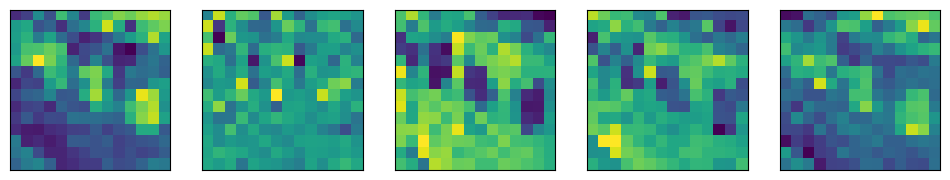

In [25]:
# Plot random 5 convolutional feature maps
import random
random_indexes = random.sample(range(0, 758), k=5) # pick 5 numbers between 0 and the embedding size
print(f"Showing random convolutional feature maps from indexes: {random_indexes}")

# Create plot
fig, axs = plt.subplots(nrows=1, ncols=5, figsize=(12, 12))

# Plot random image feature maps
for i, idx in enumerate(random_indexes):
    image_conv_feature_map = image_out_of_conv[:, idx, :, :] # index on the output tensor of the convolutional layer
    axs[i].imshow(image_conv_feature_map.squeeze().detach().numpy())
    axs[i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[]);

피처 맵이 원본 이미지를 어떻게 표현하는지 살펴보고, 몇 번 더 시각화하면 다양한 주요 윤곽선과 몇 가지 주요 특징을 볼 수 있습니다.

주의해야 할 점은 신경망이 학습함에 따라 이러한 특징이 시간이 지남에 따라 바뀔 수 있다는 것입니다.

따라서 이러한 특징 맵은 학습 가능한 **이미지 임베딩**으로 간주할 수 있습니다.

한 가지를 수치로 확인해 보겠습니다.

In [26]:
# Get a single feature map in tensor form
single_feature_map = image_out_of_conv[:, 0, :, :]
single_feature_map, single_feature_map.requires_grad

(tensor([[[ 0.1652,  0.1003,  0.1353,  0.0742,  0.0980,  0.2187,  0.0631,
            0.0644,  0.1917,  0.0467,  0.0326,  0.0255,  0.0269,  0.0245],
          [ 0.0256,  0.1443,  0.1394,  0.1504,  0.1549,  0.1951,  0.1378,
            0.0376,  0.0296,  0.2059,  0.0822,  0.0473,  0.1882,  0.0310],
          [ 0.0191,  0.0878,  0.0480,  0.1125,  0.1189,  0.1651,  0.2146,
            0.1568,  0.1634,  0.1397,  0.1274,  0.0308,  0.0028,  0.1612],
          [ 0.0870,  0.0199,  0.0087,  0.0223,  0.1200,  0.1483,  0.1017,
            0.1098,  0.1857,  0.2087,  0.1735,  0.2009,  0.1607,  0.1195],
          [ 0.1180,  0.0287,  0.0919,  0.0412,  0.1746,  0.1001,  0.0134,
           -0.0026,  0.1811,  0.1740,  0.1547,  0.1731,  0.1435,  0.1434],
          [ 0.0613,  0.2105,  0.1295,  0.0265,  0.0435,  0.1174,  0.0314,
            0.0332,  0.1473,  0.1403,  0.1240,  0.1074,  0.1114,  0.1066],
          [ 0.1373,  0.1349,  0.1663,  0.1984,  0.1753,  0.1381,  0.0273,
            0.0389,  0.1308,  0.

single_feature_map의  grad_fn과 requires_grad = True이다.  
학습이 가능하다는 뜻이다. 

4.4 Flattening the patch embedding with torch.nn.Flatten()

이미지를 패치 임베딩으로 전환했지만 여전히 2D 형식입니다.

ViT 모델의 패치 임베딩 레이어에서 원하는 출력 모양으로 변환하려면 어떻게 해야 할까요?

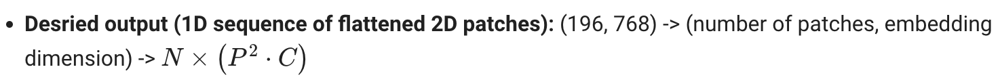

현재 shape를 확인해보자.

In [27]:
# Current tensor shape
print(f"Current tensor shape: {image_out_of_conv.shape} -> [batch, embedding_dim, feature_map_height, feature_map_width]")

Current tensor shape: torch.Size([1, 768, 14, 14]) -> [batch, embedding_dim, feature_map_height, feature_map_width]


768개 파트는 얻었지만 패치수 N이 필요하다.  
 입력 시퀀스는 단순히 피처 맵의 공간 차원을 평평하게 하고 트랜스포머 차원으로 투영하여 얻을 수 있습니다.

ViT 백서의 섹션 3.1을 다시 읽어보면 다음과 같이 나와 있습니다.:  
특수한 경우로, 패치는 공간 크기가 1x1일 수 있는데, 이는 피처 맵의 공간 차원을 평평하게 하고 트랜스포머 차원으로 투영하여 입력 시퀀스를 얻을 수 있다는 것을 의미합니다.

파이토치의 Flatten()을 사용하면 될까?  
그러나 우리는 전체 텐서를 flatten하도록 원하는 것이 아니고, feature map의 spatial dimension만 flatten하고자 한다.   

따라사 start_dim, end_dim을 지정하면 된다.

In [28]:
# Create flatten layer
flatten = nn.Flatten(start_dim=2, # flatten feature_map_height (dimension 2)
                     end_dim=3) # flatten feature_map_width (dimension 3)

이 모든 것을 한번에 진행해보자.   

1. Take a single image.
2. Put in through the convolutional layer (conv2d) to turn the image into 2D feature maps (patch embeddings).
3. Flatten the 2D feature map into a single sequence.

Original image shape: torch.Size([3, 224, 224])
Image feature map shape: torch.Size([1, 768, 14, 14])
Flattened image feature map shape: torch.Size([1, 768, 196])


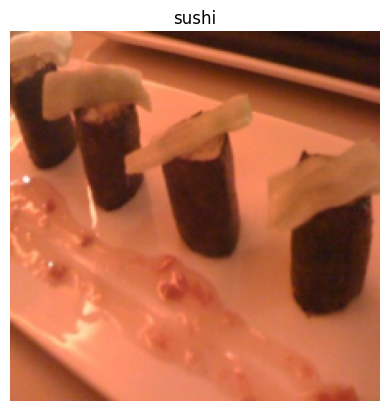

In [29]:
# 1. View single image
plt.imshow(image.permute(1, 2, 0)) # adjust for matplotlib
plt.title(class_names[label])
plt.axis(False);
print(f"Original image shape: {image.shape}")

# 2. Turn image into feature maps
image_out_of_conv = conv2d(image.unsqueeze(0)) # add batch dimension to avoid shape errors
print(f"Image feature map shape: {image_out_of_conv.shape}")

# 3. Flatten the feature maps
image_out_of_conv_flattened = flatten(image_out_of_conv)
print(f"Flattened image feature map shape: {image_out_of_conv_flattened.shape}")

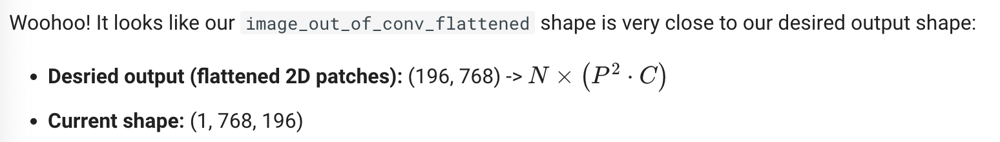

약간의 차이가 있다. 어떻게 수정할까.   
permute 메서드를 사용하면 된다.

In [30]:
# Get flattened image patch embeddings in right shape 
image_out_of_conv_flattened_reshaped = image_out_of_conv_flattened.permute(0, 2, 1) # [batch_size, P^2•C, N] -> [batch_size, N, P^2•C]
print(f"Patch embedding sequence shape: {image_out_of_conv_flattened_reshaped.shape} -> [batch_size, num_patches, embedding_size]")

Patch embedding sequence shape: torch.Size([1, 196, 768]) -> [batch_size, num_patches, embedding_size]


이제 flatten된 것을 시각화 해보자.

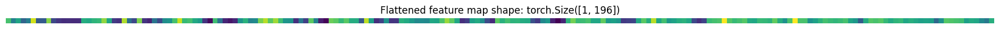

In [31]:
# Get a single flattened feature map
single_flattened_feature_map = image_out_of_conv_flattened_reshaped[:, :, 0] # index: (batch_size, number_of_patches, embedding_dimension)

# Plot the flattened feature map visually
plt.figure(figsize=(22, 22))
plt.imshow(single_flattened_feature_map.detach().numpy())
plt.title(f"Flattened feature map shape: {single_flattened_feature_map.shape}")
plt.axis(False);

평평해진 피처 맵은 시각적으로 별로 좋아 보이지 않지만,  
우리가 걱정하는 것은 이것이 아니라 패치 임베딩 레이어의 출력이자 나머지 ViT 아키텍처에 대한 입력이 될 것입니다.

참고: 원래 트랜스포머 아키텍처는 텍스트와 함께 작동하도록 설계되었습니다.  
비전 트랜스포머 아키텍처(ViT)는 원래 트랜스포머를 이미지에 사용하는 것을 목표로 했습니다.  
그렇기 때문에 ViT 아키텍처에 대한 입력이 있는 그대로 처리됩니다.  
기본적으로 2D 이미지를 가져와서 1D 텍스트 시퀀스로 표시되도록 형식을 지정하는 것입니다.

평면화된 특징 맵을 텐서 형식으로 보면 어떨까요?

In [32]:
# See the flattened feature map as a tensor
single_flattened_feature_map, single_flattened_feature_map.requires_grad, single_flattened_feature_map.shape

(tensor([[ 0.1652,  0.1003,  0.1353,  0.0742,  0.0980,  0.2187,  0.0631,  0.0644,
           0.1917,  0.0467,  0.0326,  0.0255,  0.0269,  0.0245,  0.0256,  0.1443,
           0.1394,  0.1504,  0.1549,  0.1951,  0.1378,  0.0376,  0.0296,  0.2059,
           0.0822,  0.0473,  0.1882,  0.0310,  0.0191,  0.0878,  0.0480,  0.1125,
           0.1189,  0.1651,  0.2146,  0.1568,  0.1634,  0.1397,  0.1274,  0.0308,
           0.0028,  0.1612,  0.0870,  0.0199,  0.0087,  0.0223,  0.1200,  0.1483,
           0.1017,  0.1098,  0.1857,  0.2087,  0.1735,  0.2009,  0.1607,  0.1195,
           0.1180,  0.0287,  0.0919,  0.0412,  0.1746,  0.1001,  0.0134, -0.0026,
           0.1811,  0.1740,  0.1547,  0.1731,  0.1435,  0.1434,  0.0613,  0.2105,
           0.1295,  0.0265,  0.0435,  0.1174,  0.0314,  0.0332,  0.1473,  0.1403,
           0.1240,  0.1074,  0.1114,  0.1066,  0.1373,  0.1349,  0.1663,  0.1984,
           0.1753,  0.1381,  0.0273,  0.0389,  0.1308,  0.1410,  0.1119,  0.0501,
           0.024

4.5 Turning the ViT patch embedding layer into a PyTorch module 
구현 순서는 다음과 같다.  
- 1. `PatchEmbedding` 클래스를 생성하고 nn.Module을 서브 클래싱
- 2. Vit-Base를 위해 in_channels = 3, patch_size=16으로 초기화. 그리고 embedding_dim = 768(Table.1의 D)
- 3. 이미지를 패치로 만드는 nn.Conv2d()레이어 추가(4.3에 설명한 것)
- 4. 패치를 flatten해서 단일 dimension을 만드는 레이어 생성(4.4에 설명한 것)
- 5. forward() 메서드 정의
- 6. output shape 지정( $N*(P^2C)$)

In [33]:
# 1. Create a class which subclasses nn.Module
class PatchEmbedding(nn.Module):
    """Turns a 2D input image into a 1D sequence learnable embedding vector.
    
    Args:
        in_channels (int): Number of color channels for the input images. Defaults to 3.
        patch_size (int): Size of patches to convert input image into. Defaults to 16.
        embedding_dim (int): Size of embedding to turn image into. Defaults to 768.
    """ 
    # 2. Initialize the class with appropriate variables
    def __init__(self, 
                 in_channels:int=3,
                 patch_size:int=16,
                 embedding_dim:int=768):
        super().__init__()
        
        # 3. Create a layer to turn an image into patches
        self.patcher = nn.Conv2d(in_channels=in_channels,
                                 out_channels=embedding_dim,
                                 kernel_size=patch_size,
                                 stride=patch_size,
                                 padding=0)
        
        # 4. 패치를 flatten해서 단일 dimention으로 만듬
        self.flatten = nn.Flatten( # 확인요
            start_dim=2, # 배치는 유지해야 하므로..
            end_dim=3
        )
        
    def forward(self, x):
        # 입력이 제대로된 shape인지 ㄴ체크하는 assertion 생성
        image_resolution = x.shape[-1]
        assert image_resolution % patch_size == 0, f"Input image size must be divisble by patch size, image shape: {image_resolution}, patch size: {patch_size}"
        
        x_patched = self.patcher(x)
        x_flattened = self.flatten(x_patched)
        
        # 6. 출력 shape순서 설정
        # [batch_size, P^2•C, N] -> [batch_size, N, P^2•C]
        return x_flattened.permute(0, 2, 1)

단일 이미지에 대해서 진행해본다.

In [34]:
set_seeds()

# 패치 임베딩 레잉어 생성
patchify = PatchEmbedding(in_channels=3,
                          patch_size=16,
                          embedding_dim=768)

print(f"Input image shape: {image.unsqueeze(0).shape}")
patch_embedded_image = patchify(image.unsqueeze(0))
print(f"Output patch embedding shape: {patch_embedded_image.shape}")

Input image shape: torch.Size([1, 3, 224, 224])
Output patch embedding shape: torch.Size([1, 196, 768])


- 입력 : H, W, C 사이즈의 2D 데이터
- 출력 : flattened 된 1D sequence

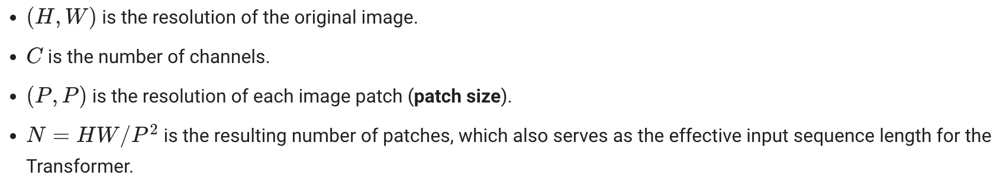

지금까지 equation 1의 패치 임베딩을 구현해봤다.  
하지만 아직 토큰/포지션 임베딩이 아니다.

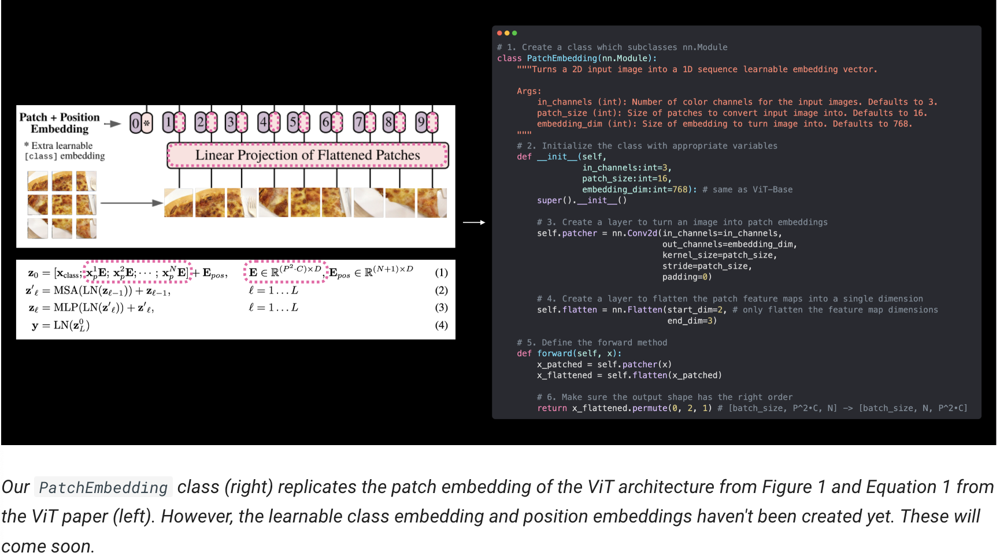

마지막으로 랜덤 데이터를 입력해서 서머리 테스트를 해보자.

In [35]:
# Create random input sizes
random_input_image = (1, 3, 224, 224)
random_input_image_error = (1, 3, 250, 250) # will error because image size is incompatible with patch_size

# Get a summary of the input and outputs of PatchEmbedding (uncomment for full output)
summary(PatchEmbedding(), 
        input_size=random_input_image, # try swapping this for "random_input_image_error" 
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"])

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
PatchEmbedding (PatchEmbedding)          [1, 3, 224, 224]     [1, 196, 768]        --                   True
├─Conv2d (patcher)                       [1, 3, 224, 224]     [1, 768, 14, 14]     590,592              True
├─Flatten (flatten)                      [1, 768, 14, 14]     [1, 768, 196]        --                   --
Total params: 590,592
Trainable params: 590,592
Non-trainable params: 0
Total mult-adds (M): 115.76
Input size (MB): 0.60
Forward/backward pass size (MB): 1.20
Params size (MB): 2.36
Estimated Total Size (MB): 4.17

4.6 Creating the class token embedding   
패치 임베딩을 만들었고, 이제 클래스 토큰 임베딩을 구현할 차례다.  
즉, 식(1)의 Xclass를 구현하는 것이다.

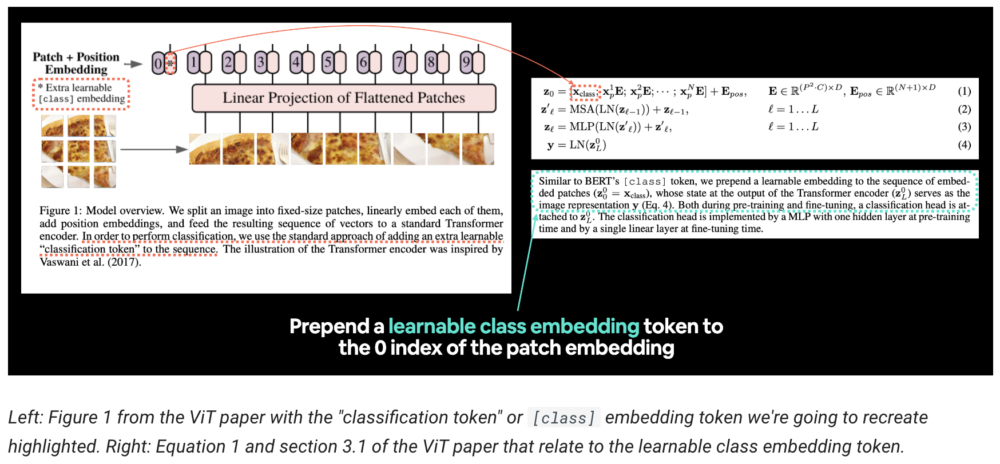

논문의 3.1에 다음과 같은 내용이 나온다.

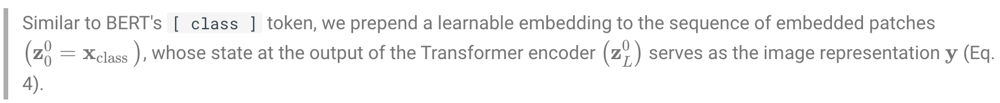

BERT의 [ class ] 토큰과 유사하게,  
학습 가능한 임베딩을 패치 시퀀스(z0^0 = Xclass)에 추가하고, 트랜스포머 인코더의 출력 상태(zL^0)가 이미지 표현 y로 사용됩니다.(방정식 4).   
  
참고: BERT(Bidirectional Encoder Representations from Transformers)는 Transformer 아키텍처를 사용하여 자연어 처리(NLP) 작업에서 뛰어난 결과를 얻은 최초의 머신러닝 연구 논문 중 하나로, 시퀀스의 시작 부분에 [ class ] 토큰을 갖는다는 아이디어가 시작된 곳이며, 여기서 class는 시퀀스가 속하는 '분류' 클래스에 대한 설명입니다.

- 참고 : 버트는 시퀀스 시작 부분에 [ class ] 토큰을 갖는다는 아이디어가 시작된 곳이며, 여기서 class는 시퀀스가 속하는 '분류' 클래스에 대한 설명이다.

따라서 임베드된 패치의 시퀀스에 learnable embedding을 추가한다.   
먼저 앞에서 테스트한 페치 시퀀스를 살펴보자.

In [36]:
print(patch_embedded_image)  


tensor([[[-0.7794,  0.1472, -0.0446,  ...,  0.4347, -0.4209,  0.2003],
         [-0.6814,  0.1030, -0.0515,  ...,  0.4051, -0.3824,  0.2538],
         [-0.7014,  0.0155, -0.0560,  ...,  0.4231, -0.4063,  0.2673],
         ...,
         [-0.5796,  0.0405, -0.0352,  ...,  0.2644, -0.3153,  0.2683],
         [-0.5843,  0.0120,  0.0537,  ...,  0.2609, -0.3567,  0.2097],
         [-0.6013,  0.0438, -0.0641,  ...,  0.3473, -0.3168,  0.2301]]],
       grad_fn=<PermuteBackward0>)


In [37]:
print(f"Patch embedding shape: {patch_embedded_image.shape} -> [batch_size, number_of_patches, embedding_dimension]")

Patch embedding shape: torch.Size([1, 196, 768]) -> [batch_size, number_of_patches, embedding_dimension]


learnable embedding을 부착하기 위해 embedding_dimension (D) shape의 임베딩을  생성하고,  
number_of_patches dimension에 추가한다.   

"임베딩된 패치 시퀀스에 학습 가능한 임베딩을 추가"하려면, 
'embedding_dimension'(D) shape로 학습 가능한 임베딩을 만든 다음 number_of_patches dimension에 추가해야 합니다.

pseudoecode로 설명하면  
```python
patch_embedding = [image_patch_1, image_patch_2, image_patch_3...]
class_token = learnable_embedding
patch_embedding_with_class_token = torch.cat((class_token, patch_embedding), dim=1)
```

torch.cat()를 사용하면 dim = 1, number_of_patches 차원에 연결한다..

이를 위해 배치 크기와 임베딩 차원 모양을 가져온 다음, [batch_size, 1, embedding_dimension] 모양으로 torch.ones() 텐서를 생성합니다.   
그리고 learnable 텐서를 사용하기 때문에. nn.Parameter()에 requires_grad=True로 전달하여 학습할 수 있게 만들겠습니다.

In [38]:
patch_embedded_image.shape

torch.Size([1, 196, 768])

In [39]:
batch_size = patch_embedded_image.shape[0]
embedding_dimension = patch_embedded_image.shape[-1]


class_token = nn.Parameter(data = torch.ones(batch_size, 1, embedding_dimension),
                           requires_grad=True
                           )

print(class_token[:, :, :10])

tensor([[[1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]]], grad_fn=<SliceBackward0>)


In [40]:
# Print the class_token shape
print(f"Class token shape: {class_token.shape} -> [batch_size, number_of_tokens, embedding_dimension]")

Class token shape: torch.Size([1, 1, 768]) -> [batch_size, number_of_tokens, embedding_dimension]


- 참고 : 여기서는 데모 목적으로 클래스 토큰 임베딩을 torch.ones()로 생성했지만,  
실제로는 torch.randn()으로 클래스 토큰 임베딩을 생성할 가능성이 높습니다.    
(머신러닝은 제어된 무작위성의 힘을 활용하는 것이므로 일반적으로 임의의 숫자로 시작하여 시간이 지남에 따라 개선해 나가게 됩니다).

패치 임베딩 시퀀스의 시작 부분에 하나의 클래스 토큰 값만 추가하고 싶기 때문에 class_token의 number_of_tokens 차원이 1인 이유를 확인하세요.   
이제 torch.cat()을 사용하여 dim=1을 설정하면 됩니다.   
(따라서 class_token의 number_of_tokens 차원이 patch_embedded_image의 number_of_patches 차원에 추가됩니다).

In [41]:
patch_embedded_image_with_class_embedding = torch.cat((class_token, patch_embedded_image),
                                                      dim = 1
                                                      )

print(patch_embedded_image_with_class_embedding)

tensor([[[ 1.0000,  1.0000,  1.0000,  ...,  1.0000,  1.0000,  1.0000],
         [-0.7794,  0.1472, -0.0446,  ...,  0.4347, -0.4209,  0.2003],
         [-0.6814,  0.1030, -0.0515,  ...,  0.4051, -0.3824,  0.2538],
         ...,
         [-0.5796,  0.0405, -0.0352,  ...,  0.2644, -0.3153,  0.2683],
         [-0.5843,  0.0120,  0.0537,  ...,  0.2609, -0.3567,  0.2097],
         [-0.6013,  0.0438, -0.0641,  ...,  0.3473, -0.3168,  0.2301]]],
       grad_fn=<CatBackward0>)


In [42]:
print(f"Sequence of patch embeddings with class token prepended shape: {patch_embedded_image_with_class_embedding.shape} -> [batch_size, number_of_patches, embedding_dimension]")

Sequence of patch embeddings with class token prepended shape: torch.Size([1, 197, 768]) -> [batch_size, number_of_patches, embedding_dimension]


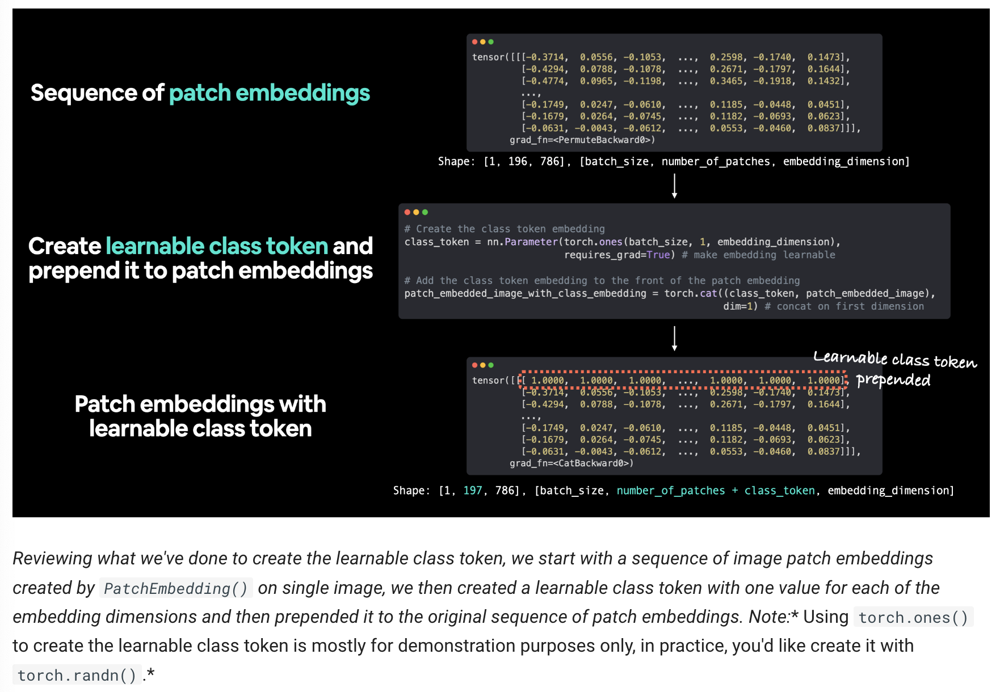

4.7 Creating the position embedding
  
클래스 토큰 임베딩과 패치 임베딩이 완료되었으니 이제 위치 임베딩은 어떻게 만들 수 있을까요?   
수식 1의 Epos를 의미한다.

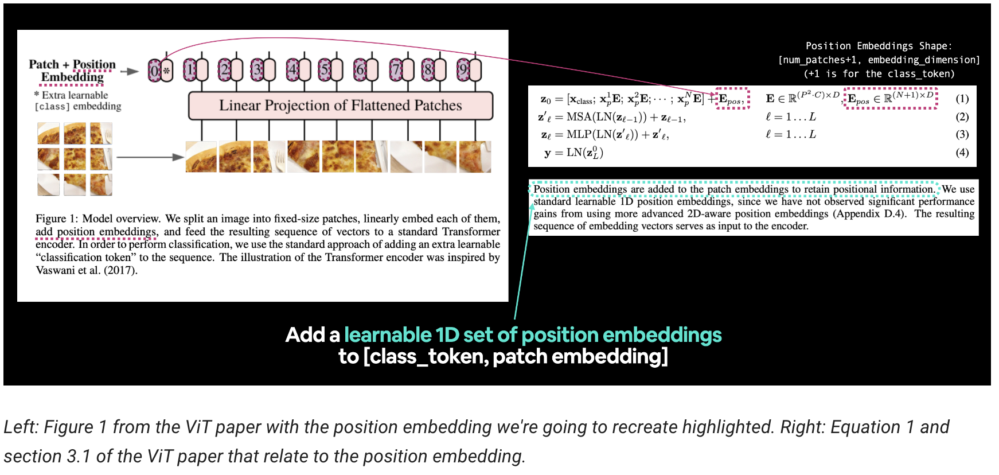

눈문의 section 3.1을 살펴보자.

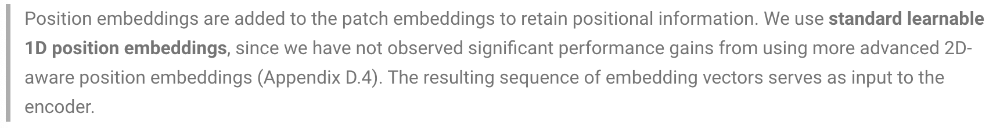

위치 임베딩은 위치 정보를 유지하기 위해 패치 임베딩에 추가됩니다.  
고급 2D 인식 위치 임베딩을 사용해도 성능이 크게 향상되지 않았기 때문에 표준 학습 가능한 1D 위치 임베딩을 사용합니다(부록 D.4).  
임베딩 벡터의 결과 시퀀스는 인코더에 입력으로 사용됩니다.

"위치 정보를 유지"한다는 것은 아키텍처가 패치가 어떤 '순서'로 적용되는지 알기를 원한다는 의미입니다. 즉, 두 번째 패치는 첫 번째 패치 다음에 오고 세 번째 패치는 두 번째 패치 다음에 오는 식입니다.  

이 위치 정보는 이미지의 내용을 고려할 때 중요할 수 있습니다(위치 정보가 없는 평평한 시퀀스는 순서가 없는 것으로 보일 수 있으므로 어떤 패치도 다른 패치와 관련이 없습니다).  

위치 임베딩 생성을 시작하려면 현재 임베딩을 확인해 보겠습니다.

In [43]:
patch_embedded_image_with_class_embedding

tensor([[[ 1.0000,  1.0000,  1.0000,  ...,  1.0000,  1.0000,  1.0000],
         [-0.7794,  0.1472, -0.0446,  ...,  0.4347, -0.4209,  0.2003],
         [-0.6814,  0.1030, -0.0515,  ...,  0.4051, -0.3824,  0.2538],
         ...,
         [-0.5796,  0.0405, -0.0352,  ...,  0.2644, -0.3153,  0.2683],
         [-0.5843,  0.0120,  0.0537,  ...,  0.2609, -0.3567,  0.2097],
         [-0.6013,  0.0438, -0.0641,  ...,  0.3473, -0.3168,  0.2301]]],
       grad_fn=<CatBackward0>)

In [44]:
patch_embedded_image_with_class_embedding.shape

torch.Size([1, 197, 768])

포지션 임베딩 $E_pos$는 (N +1) x D shape를 가져야한다.

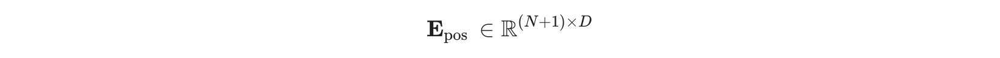

여기서 
- $N = HW/P^2$는 트랜스포머의 입력 시퀀스 길이에 해당하는 패치의 수이다.
- D는 패치 임베딩 사이즈이다.

이제 torch.ones()를 사용해서 학습 가능한 1D 임베딩 $E_pos$를 만들어보자.

In [45]:
height, width, patch_size

(224, 224, 16)

In [46]:
# N : number of patches 계산하기
number_of_patches = int((height * width) / patch_size**2)

# embedding dimension 구하기
embedding_dimension = patch_embedded_image_with_class_embedding.shape[2]

position_embedding = nn.Parameter(torch.ones(1,
                                             number_of_patches+1,
                                             embedding_dimension
                                             ),
                                  requires_grad=True)

In [47]:
print(f"Position embeddding shape: {position_embedding.shape} -> [batch_size, number_of_patches, embedding_dimension]")

Position embeddding shape: torch.Size([1, 197, 768]) -> [batch_size, number_of_patches, embedding_dimension]


- 참고 : 데모를 위해 위치 임베딩을 torch.ones()로 만들었을 뿐, 실제로는 torch.randn()으로 위치 임베딩을 만들 것입니다(임의의 숫자로 시작하여 경사 하강을 통해 개선).  

클래스 토큰을 추가하여 패치 임베딩 시퀀스에 추가해 보겠습니다.

In [48]:
# Add the position embedding to the patch and class token embedding
patch_and_position_embedding = patch_embedded_image_with_class_embedding + position_embedding
# print(patch_and_position_embedding)
print(f"Patch embeddings, class token prepended and positional embeddings added shape: {patch_and_position_embedding.shape} -> [batch_size, number_of_patches, embedding_dimension]")

Patch embeddings, class token prepended and positional embeddings added shape: torch.Size([1, 197, 768]) -> [batch_size, number_of_patches, embedding_dimension]


In [49]:
print(patch_and_position_embedding)

tensor([[[2.0000, 2.0000, 2.0000,  ..., 2.0000, 2.0000, 2.0000],
         [0.2206, 1.1472, 0.9554,  ..., 1.4347, 0.5791, 1.2003],
         [0.3186, 1.1030, 0.9485,  ..., 1.4051, 0.6176, 1.2538],
         ...,
         [0.4204, 1.0405, 0.9648,  ..., 1.2644, 0.6847, 1.2683],
         [0.4157, 1.0120, 1.0537,  ..., 1.2609, 0.6433, 1.2097],
         [0.3987, 1.0438, 0.9359,  ..., 1.3473, 0.6832, 1.2301]]],
       grad_fn=<AddBackward0>)


임베딩 텐서에서 각 요소의 값이 1씩 증가하는 것을 확인할 수 있습니다(이는 torch.ones()로 위치 임베딩이 생성되기 때문입니다).

- 참고: 원한다면 클래스 토큰 임베딩과 위치 임베딩을 모두 자체 레이어에 넣을 수 있습니다. 하지만 이 두 가지를 전체 ViT 아키텍처의 forward() 메서드에 통합하는 방법은 섹션 8의 뒷부분에서 살펴보겠습니다.

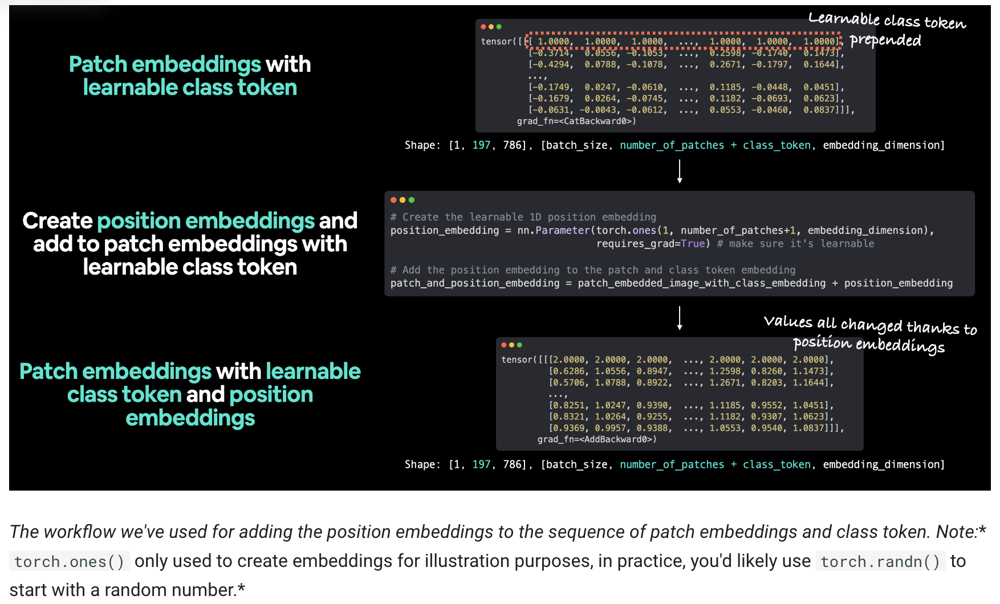

4.8 Putting it all together: from image to embedding

자, 입력 이미지를 임베딩으로 전환하고 ViT 백서 3.1절의 방정식 1을 복제하는 데 많은 진전을 이루었습니다:

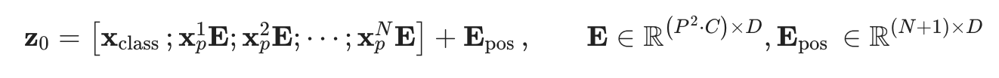

이제 입력 이미지 x와 출력 임베딩 z0 사이의 코드를 한번에 작성해보자.

- 1. Setting the patch size (we'll use 16 as it's widely used throughout the paper and for ViT-Base).
- 2. Getting a single image, printing its shape and storing its height and width.
- 3. Adding a batch dimension to the single image so it's compatible with our PatchEmbedding layer.
- 4. Creating a PatchEmbedding layer (the one we made in section 4.5) with a patch_size=16 and embedding_dim=768 (from Table 1 for ViT-Base).
- 5. Passing the single image through the PatchEmbedding layer in 4 to create a sequence of patch embeddings.
- 6. Creating a class token embedding like in section 4.6.
- 7. Prepending the class token emebdding to the patch embeddings created in step 5.
- 8. Creating a position embedding like in section 4.7.
- 9. Adding the position embedding to the class token and patch embeddings created in step 7.

1. 패치 크기 설정(여기서는 16을 사용하겠습니다. 이 크기는 종이 전체와 ViT-Base에 널리 사용되기 때문입니다).  

2. 단일 이미지를 가져와서 모양을 인쇄하고 높이와 너비를 저장합니다.  

3. 단일 이미지에 배치 치수를 추가하여 패치 임베딩 레이어와 호환되도록 합니다.  

4. 패치 크기=16, 임베딩 크기=768로 패치 임베딩 레이어(4.5절에서 만든 것)를 만듭니다(ViT-Base의 경우 표 1 참조).  

5. 단일 이미지를 4의 패치 임베딩 레이어에 전달하여 패치 임베딩 시퀀스를 생성합니다.  

6. 4.6절에서와 같이 클래스 토큰 임베딩을 생성합니다.  

7. 5단계에서 생성한 패치 임베딩에 클래스 토큰 임베딩을 준비합니다.  
 
8. 섹션 4.7에서와 같이 위치 임베딩 생성.  

9. 7단계에서 생성한 클래스 토큰과 패치 임베딩에 위치 임베딩을 추가합니다.  

In [50]:
set_seeds()

# 1. 패치 사이즈
patch_size = 16

# 2. 원본 이미지 shape확인
print(f"Image tensor shape: {image.shape}")
height, width = image.shape[1], image.shape[2]

# 3. 이미지 텐서에 패치 디멘전 추가
x = image.unsqueeze(0)
print(f"Input image with batch dimension shape: {x.shape}")

Image tensor shape: torch.Size([3, 224, 224])
Input image with batch dimension shape: torch.Size([1, 3, 224, 224])


In [51]:
# 4. Create pathch embedding layer
patch_embedding_layer = PatchEmbedding(in_channels=3,
                                       patch_size=patch_size,
                                       embedding_dim=768)

# 5. Pass image through patch embedding layer
patch_embedding = patch_embedding_layer(x)
print(f"Patching embedding shape: {patch_embedding.shape}")

Patching embedding shape: torch.Size([1, 196, 768])


In [52]:
# 6. Create class token embedding
batch_size = patch_embedding.shape[0]
embedding_dimension = patch_embedding.shape[-1]
class_token = nn.Parameter(torch.ones(batch_size, 1, embedding_dimension),
                           requires_grad=True) # make sure it's learnable
print(f"Class token embedding shape: {class_token.shape}")

# 7. Prepend class token embedding to patch embedding
patch_embedding_class_token = torch.cat((class_token, patch_embedding), dim=1)
print(f"Patch embedding with class token shape: {patch_embedding_class_token.shape}")

# 8. Create position embedding
number_of_patches = int((height * width) / patch_size**2)
position_embedding = nn.Parameter(torch.ones(1, number_of_patches+1, embedding_dimension),
                                  requires_grad=True) # make sure it's learnable

# 9. Add position embedding to patch embedding with class token
patch_and_position_embedding = patch_embedding_class_token + position_embedding
print(f"Patch and position embedding shape: {patch_and_position_embedding.shape}")

Class token embedding shape: torch.Size([1, 1, 768])
Patch embedding with class token shape: torch.Size([1, 197, 768])
Patch and position embedding shape: torch.Size([1, 197, 768])


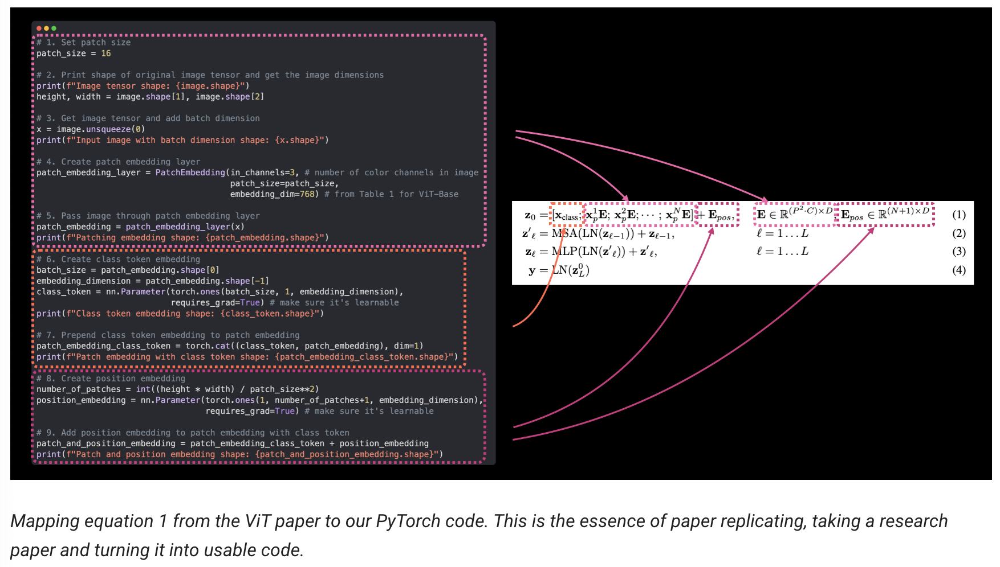

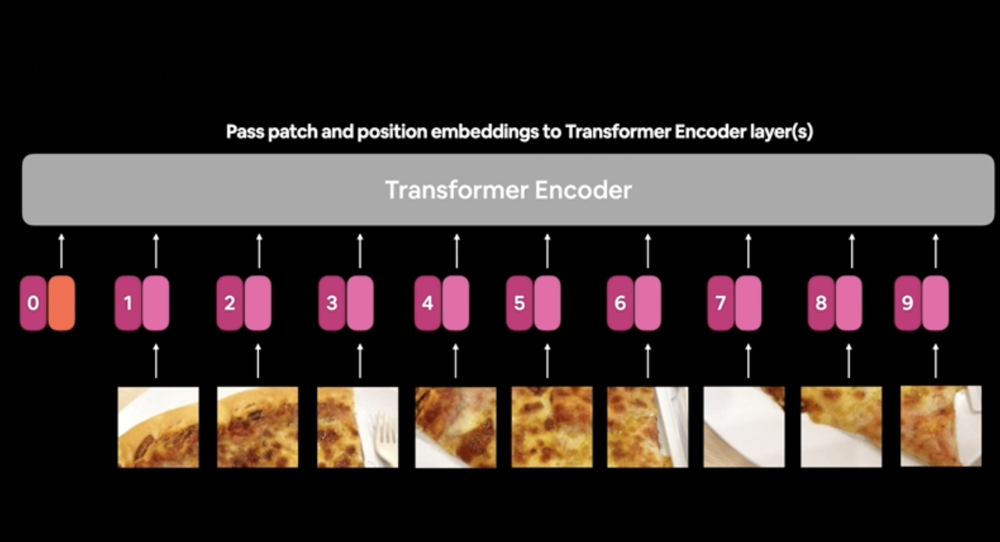

이제 이미지를 인코딩하여 ViT 백서의 그림 1에 있는 트랜스포머 인코더로 전달하는 방법이 생겼습니다.   


이제 이미지를 인코드하고 트랜스포머 인코더로 주입한다.

코드 관점에서 볼 때 패치 임베딩을 생성하는 것은 ViT 페이퍼를 복제하는 데 있어 가장 큰 부분일 것입니다.   

멀티헤드어텐션 및 표준 레이어와 같은 ViT 백서의 다른 많은 부분은 기존 PyTorch 레이어를 사용하여 만들 수 있습니다.

### 5. Equation 2: Multi-Head Attention (MSA)

입력 데이터를 패치하고 임베드했으니 이제 ViT 아키텍처의 다음 부분으로 넘어가겠습니다.   

먼저 트랜스포머 인코더 섹션을 두 부분으로 나누겠습니다(작게 시작해서 필요하면 늘려가세요).   

첫 번째는 방정식 2이고 두 번째는 방정식 3입니다.  

방정식 2의 상태를 기억하세요:

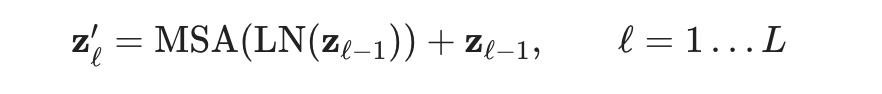

이는 residual connection(레이어에 대한 입력이 레이어의 출력에 추가됨)이 있는 LayerNorm(LN) 레이어로 래핑된 Multi-Head Attention(MSA) 레이어를 나타냅니다.

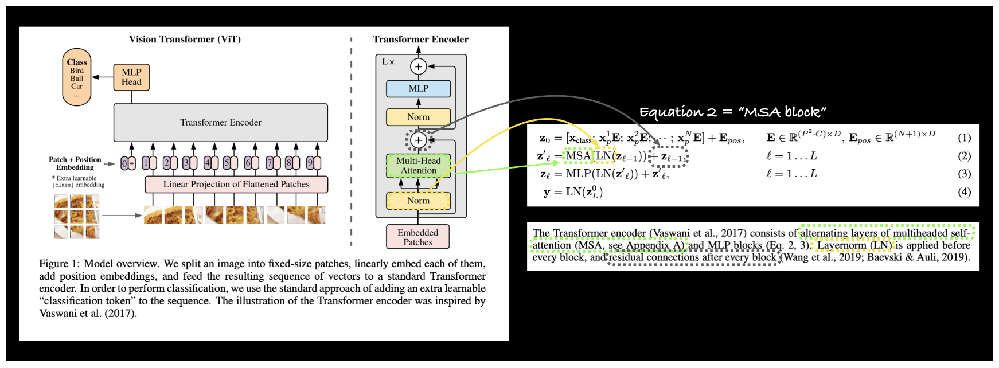

연구 논문에서 볼 수 있는 많은 레이어는 이미 PyTorch와 같은 최신 딥 러닝 프레임워크에서 구현되어 있습니다.

즉, 이러한 레이어와 파이토치 코드와의 잔여 연결을 복제하기 위해 사용할 수 있습니다:

- Multi-Head Self Attention (MSA) : torch.nn.MultiheadAttention().
- Norm (LN or LayerNorm) : torch.nn.LayerNorm().
- Residual connection : add the input to output (we'll see this later on when we create the full Transformer Encoder block in section 7.1).

5.1 The LayerNorm (LN) layer

레이어 정규화(torch.nn.LayerNorm() 또는 Norm, LayerNorm, LN)는 마지막 차원에 대한 입력을 정규화합니다.???  
  
torch.nn.LayerNorm()의 공식적인 정의는 PyTorch 문서에서 찾을 수 있습니다.   


PyTorch의 torch.nn.LayerNorm()의 주요 매개변수는 normalized_shape이며,  
정규화화하려는 차원 크기와 같도록 설정할 수 있습니다(이 경우 ViT-Base의 경우 또는 768).   

어떤 역할을 할까요?   

레이어 정규화는 학습 시간과 모델 일반화(보이지 않는 데이터에 적응하는 능력)를 개선하는 데 도움이 됩니다.   

저는 모든 종류의 정규화를 "데이터를 유사한 형식으로 가져오는 것" 또는 "데이터 샘플을 유사한 분포로 가져오는 것"이라고 생각하고 싶습니다.   

높이와 길이가 모두 다른 계단 세트를 오르내리려고 한다고 상상해 보세요.   

각 계단마다 약간의 조정이 필요하겠죠?   

그리고 각 스텝마다 학습한 내용이 모두 다르기 때문에, 다음 스텝에서는 도움이 되지 않아 스텝을 탐색하는 데 걸리는 시간이 길어집니다.   

정규화(레이어 정규화 포함)는 계단이 데이터 샘플이라는 점을 제외하고 모든 스텝의 높이와 길이를 동일하게 만드는 것과 같습니다.  

따라서 높이와 길이가 비슷한 계단을 높이와 폭이 다른 계단보다 훨씬 쉽게 오르내릴 수 있는 것처럼, 신경망은 다양한 분포를 가진 데이터 샘플보다 유사한 분포(비슷한 평균과 표준 편차)를 가진 데이터 샘플에 대해 더 쉽게 최적화할 수 있습니다.

5.2 The Multi-Head Self Attention (MSA) layer

원래 텍스트 입력을 위해 설계된 기존의 셀프어텐션 메커니즘은 단어의 순서를 취한 다음 어떤 단어가 다른 단어에 더 많은 "주의"를 기울여야 하는지 계산합니다.

즉, "개가 울타리를 뛰어넘었다"라는 문장에서 "개"라는 단어는 "뛰어넘다" 및 "울타리"와 밀접한 관련이 있을 수 있습니다.

이것은 단순화되었지만 이미지에 대한 전제는 남아 있습니다.

입력은 단어가 아닌 이미지 패치 시퀀스이기 때문에 멀티헤드 어텐션이 어떤 이미지 패치가 다른 패치와 가장 관련이 있는지 계산하여 결국 이미지의 학습된 표현을 형성합니다.

하지만 가장 중요한 것은 레이어에서 데이터가 주어지면 스스로 이 작업을 수행한다는 것입니다(어떤 패턴을 학습할지 알려주지 않음).

레이어가 MSA를 사용하여 형성한 학습된 표현이 좋으면 모델 성능에서 그 결과를 확인할 수 있습니다.

온라인에서 Transformer 아키텍처와 어텐션 메커니즘에 대해 자세히 알아볼 수 있는 자료는 Jay Alammar의 멋진 일러스트 트랜스포머 게시물과 일러스트 주의 게시물 등 여러 가지가 있습니다.

여기서는 직접 구현하는 것보다 기존 PyTorch MSA 구현을 코딩하는 데 더 중점을 두겠습니다.

그러나 ViT 백서의 MSA 구현에 대한 공식적인 정의는 부록 A에서 확인할 수 있습니다:

- https://jalammar.github.io/illustrated-transformer/
- https://jalammar.github.io/visualizing-neural-machine-translation-mechanics-of-seq2seq-models-with-attention/

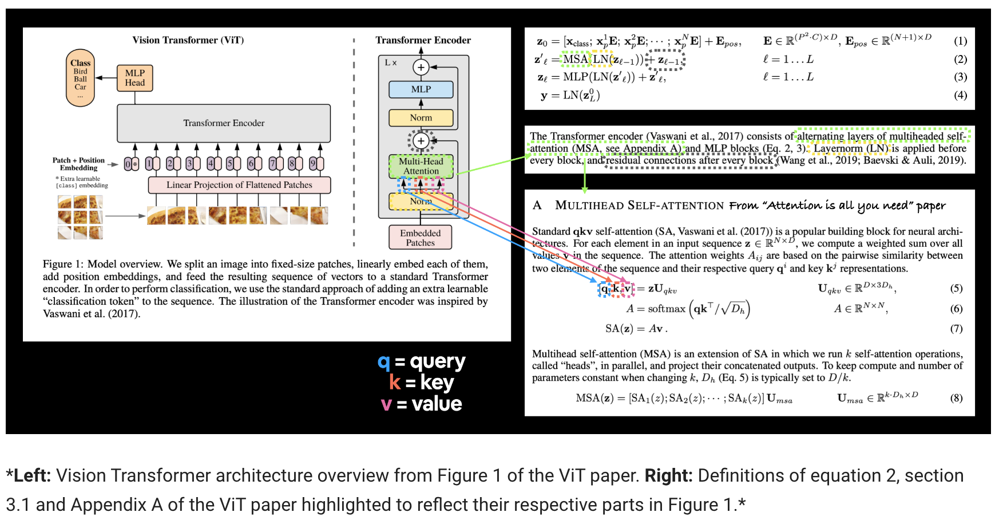

위 이미지는 MSA 레이어에 대한 세 가지 임베딩 입력을 강조하고 있습니다.   

이를 쿼리, 키, 값 입력 또는 줄여서 QKV라고 하는데, 이는 셀프어텐션 메커니즘의 기본입니다.   

이 경우 트리플 임베딩 입력은 쿼리, 키, 값에 대한 세 가지 버전의 노멀 레이어 출력입니다.   

또는 4.8절에서 생성한 레이어 정규화 이미지 패치와 위치 임베딩의 세 가지 버전입니다.   

PyTorch에서 torch.nn.MultiheadAttention()을 매개변수와 함께 사용하여 MSA 레이어를 구현할 수 있습니다:   

torch.nn.MultiheadAttention()의 주요 파라미터는 다음과 같음.  
- embed_dim - 표 1의 임베딩 차원(Hidden size D).
- num_heads - 사용할 어텐션 헤드의 수('멀티헤드'라는 용어의 유래), 이 값은 표 1(헤드)에도 나와 있습니다.
- dropout - 어텐션 레이어에 드롭아웃을 적용할지 여부(부록 B.1에 따르면, 드롭아웃은 qkv-projection 이후에는 사용되지 않음).
- batch_first - does our batch dimension come first? (yes it does)

5.3 Replicating Equation 2 with PyTorch layers

방정식 2에서 LN 및 다중 헤드 어텐션(MSA) 레이어에 대해 논의한 모든 내용을 실제로 적용해 보겠습니다.

- torch.nn.Module을 상속받아서 MultiheadSelfAttentionBlock 생성
- Table 1 의 ViT-Base model로 하이퍼파라미터 초기화
- torch.nn.LayerNorm()으로 normalization layer 생성. 이때 normalized_shape는 임베딩 디멘전 D와 같게...
- Create a multi-head attention (MSA) layer with the appropriate embed_dim, num_heads, dropout and batch_first parameters.  
- forward() 메서드 생성

In [53]:
# 1. 클래스 생성
class MultiheadSelfAttentionBlock(nn.Module):
    
    # 2.하이퍼파라미터 초기화
    def __init__(self,
                 embedding_dim: int=768,
                 num_heads: int = 12,
                 attn_dropout: float=0
                 ):
        super().__init__()
        
        # 3. create normalization layer
        self.layer_norm = nn.LayerNorm(normalized_shape=embedding_dim)
        
        # 4. create MSA layer
        self.multihead_attn = nn.MultiheadAttention(embed_dim=embedding_dim,
                                                    num_heads = num_heads,
                                                    dropout=attn_dropout,
                                                    batch_first=True
                                                    )# does our batch dimension come first?
    
    def forward(self, x):
        x = self.layer_norm(x)
        attn_output, _ = self.multihead_attn(query=x,
                                             key = x,
                                             value = x,
                                             need_weights = False # do we need the weights or just the layer outputs?
                                             )
        
        return attn_output

- fig1과 다르게 우리의 MSA 블럭은 skip이나 residual connection을 포함하고 있지 않다.   
- 이것은 7.1에서 추가할 것이다.

방금 만든 것을 테스트 해보자.

In [54]:
patch_and_position_embedding.shape

torch.Size([1, 197, 768])

In [55]:
# Create an instance of MSABlock
multihead_self_attention_block = MultiheadSelfAttentionBlock(embedding_dim=768, # from Table 1 
                                                             num_heads=12) # from Table 1

# Pass patch and position image embedding through MSABlock
patched_image_through_msa_block = multihead_self_attention_block(patch_and_position_embedding)
print(f"Input shape of MSA block: {patch_and_position_embedding.shape}")
print(f"Output shape MSA block: {patched_image_through_msa_block.shape}")

Input shape of MSA block: torch.Size([1, 197, 768])
Output shape MSA block: torch.Size([1, 197, 768])


데이터가 MSA 블록을 통과할 때 데이터의 입력 및 출력 형태가 어떻게 동일하게 유지되는지 주목하세요.

그렇다고 해서 데이터가 통과하면서 변하지 않는다는 의미는 아닙니다.

입력 및 출력 텐서를 인쇄하여 어떻게 변화하는지 확인할 수 있습니다(이 변화는 1 * 197 * 768 값에 걸쳐서 일어나므로 시각화하기 어려울 수 있습니다).

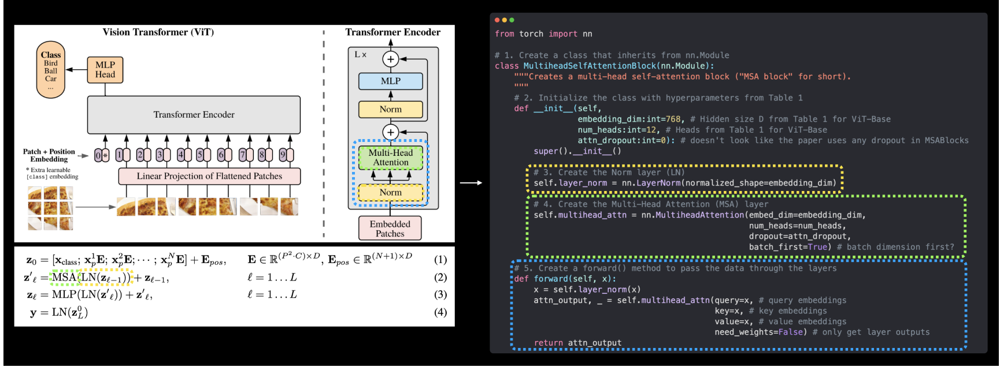

### 6. Equation 3: Multilayer Perceptron (MLP)


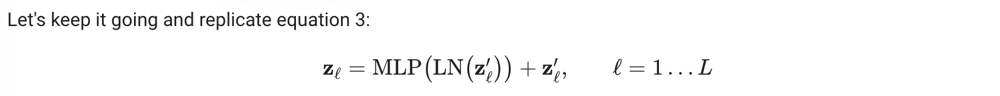

여기서 MLP는 "다층 퍼셉트론"을 의미하며, LN은 "레이어 정규화"를 의미합니다(위에서 설명한 대로).

그리고 마지막에 추가된 것은 스킵/잔여 연결입니다.

방정식 3을 트랜스포머 인코더의 "MLP 블록"이라고 하겠습니다(아키텍처를 더 작은 덩어리로 세분화하는 추세가 계속되고 있음을 주목하세요).

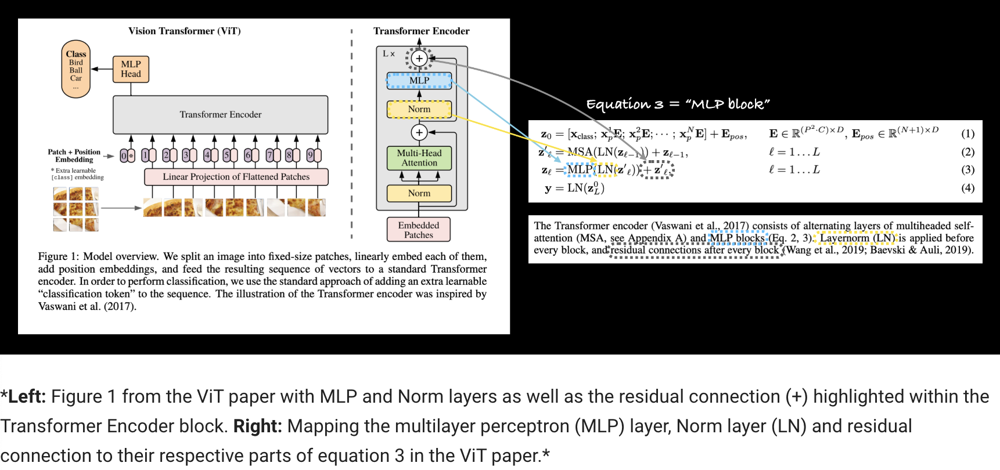

6.1 The MLP layer(s)

ViT 백서의 경우 MLP 구조는 섹션 3.1에 정의되어 있습니다:  
- MLP는 GELU 비선형성을 가진 두 개의 레이어를 포함합니다.  

여기서 '두 개의 레이어'는 선형 레이어(PyTorch의 torch.nn.Linear())를 의미하며,  
'GELU 비선형성'은 GELU(가우스 오류 선형 단위) 비선형 활성화 함수(PyTorch의 torch.nn.GELU())를 의미합니다.  

참고: 선형 레이어(torch.nn.Linear())는 "dense 레이어" 또는 "피드포워드 레이어"라고도 불립니다.  
일부 논문에서는 이 세 가지 용어를 모두 사용하여 동일한 것을 설명하기도 합니다(ViT 논문에서와 같이).  

MLP 블록에 대한 또 다른 세부 사항은 부록 B.1(훈련)에 나와 있습니다:   
- 표 3에는 다양한 모델에 대한 훈련 설정이 요약되어 있습니다. ...드롭아웃을 사용할 경우, qkv 투영을 제외한 모든 고밀도 레이어와 위치에서 패치로 임베딩을 추가한 직후에 드롭아웃이 적용됩니다.   

즉, MLP 블록의 모든 선형 레이어(또는 고밀도 레이어)에는 드롭아웃 레이어가 있습니다(PyTorch의 torch.nn.Dropout()).  

이 값은 ViT 백서의 표 3에서 확인할 수 있습니다(ViT-Base의 경우 드롭아웃=0.1).  

따라서

layer norm -> linear layer -> non-linear layer -> dropout -> linear layer -> dropout

표 1에서 선형 레이어에 대한 하이퍼파라미터 값을 사용할 수 있습니다.   
(MLP 크기는 선형 레이어 사이의 숨겨진 유니트 수이고, hidden size D는 MLP 블록의 출력 크기입니다).

6.2 Replicating Equation 3 with PyTorch layers

- MLP 블럭 생성
- ViT-Base model의 하이퍼파라미터 설정
- layer normalization (LN) layer
- MLP 레이어 생성
- forward 생성

In [56]:
# 1. Create a class that inherits from nn.Module
class MLPBlock(nn.Module):
    """Creates a layer normalized multilayer perceptron block ("MLP block" for short)."""
    # 2. Initialize the class with hyperparameters from Table 1 and Table 3
    def __init__(self,
                 embedding_dim:int=768, # Hidden Size D from Table 1 for ViT-Base
                 mlp_size:int=3072, # MLP size from Table 1 for ViT-Base
                 dropout:float=0.1): # Dropout from Table 3 for ViT-Base
        super().__init__()
        
        # 3. Create the Norm layer (LN)
        self.layer_norm = nn.LayerNorm(normalized_shape=embedding_dim)
        
        # 4. Create the Multilayer perceptron (MLP) layer(s)
        self.mlp = nn.Sequential(
            nn.Linear(in_features=embedding_dim,
                      out_features=mlp_size),
            nn.GELU(), # "The MLP contains two layers with a GELU non-linearity (section 3.1)."
            nn.Dropout(p=dropout),
            nn.Linear(in_features=mlp_size, # needs to take same in_features as out_features of layer above
                      out_features=embedding_dim), # take back to embedding_dim
            nn.Dropout(p=dropout) # "Dropout, when used, is applied after every dense layer.."
        )
    
    # 5. Create a forward() method to pass the data throguh the layers
    def forward(self, x):
        x = self.layer_norm(x)
        x = self.mlp(x)
        return x

참고: 그림 1과 달리 MLPBlock()에는 스킵 또는 잔여 연결이 포함되어 있지 않으며, 나중에 전체 트랜스포머 인코더를 만들 때 이를 포함할 예정입니다.

테스트

In [57]:
# Create an instance of MLPBlock
mlp_block = MLPBlock(embedding_dim=768, # from Table 1 
                     mlp_size=3072, # from Table 1
                     dropout=0.1) # from Table 3

# Pass output of MSABlock through MLPBlock
patched_image_through_mlp_block = mlp_block(patched_image_through_msa_block)
print(f"Input shape of MLP block: {patched_image_through_mlp_block.shape}")
print(f"Output shape MLP block: {patched_image_through_mlp_block.shape}")

Input shape of MLP block: torch.Size([1, 197, 768])
Output shape MLP block: torch.Size([1, 197, 768])


- 데이터의 입력 및 출력 모양이 MLP 블록에 들어오고 나갈 때 어떻게 동일하게 유지되는지 알 수 있습니다.

- 그러나 데이터가 MLP 블록 내의 nn.Linear() 레이어를 통과할 때 모양이 변경됩니다(표 1의 MLP 크기로 확장된 다음 표 1의 hidden size D로 다시 압축됨).

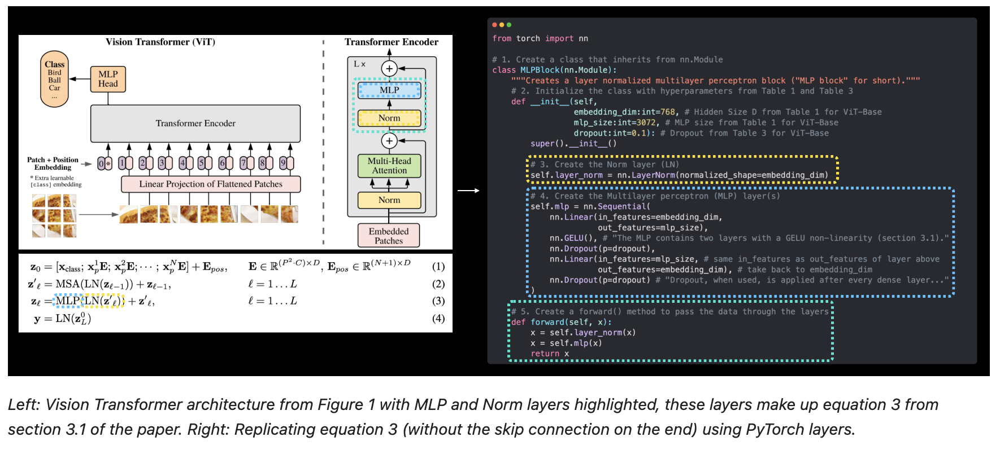

방정식 3이 복제되었습니다(끝에 있는 잔여 연결을 제외하고는 7.1절에서 다룰 것입니다)!  
이제 파이토치 코드에 방정식 2와 3을 만들었으니, 이를 조합하여 트랜스포머 인코더를 만들어 보겠습니다.  

### 7. Create the Transformer Encoder

이제 MultiheadSelfAttentionBlock(방정식 2)과 MLPBlock(방정식 3)을 함께 스택하고 ViT 아키텍처의 트랜스포머 인코더를 만들 차례입니다.  

딥 러닝에서 "인코더" 또는 "자동 인코더"는 일반적으로 입력을 "인코딩"(어떤 형태의 수치 표현으로 전환)하는 레이어 스택을 의미합니다.  

이 경우, 트랜스포머 인코더는 ViT 백서의 3.1절에 따라 일련의 MSA 블록과 MLP 블록을 번갈아 가며 사용하여 패치된 이미지를 학습된 표현으로 인코딩합니다:  

트랜스포머 인코더(Vaswani et al., 2017)는 멀티헤드 셀프어텐션(MSA, 부록 A 참조)과 MLP 블록(식 2, 3)의 교대 레이어로 구성됩니다.   레이어노름(LN)은 모든 블록 앞에 적용되고, 잔여 연결은 모든 블록 뒤에 적용됩니다(Wang et al., 2019; Baevski & Auli, 2019).  

MSA와 MLP 블록을 만들었지만 잔여 연결은 어떻게 되나요?   

잔여 연결(skip 연결이라고도 함)은 이미지 인식을 위한 심층 잔여 학습 논문에서 처음 소개되었으며, 후속 출력에 입력된 레이어를 추가함으로써 이루어집니다.  

후속 출력은 나중에 하나 이상의 레이어가 될 수 있습니다.   

ViT 아키텍처의 경우, 잔여 연결은 MSA 블록의 입력이 MLP 블록으로 전달되기 전에 MSA 블록의 출력에 다시 추가되는 것을 의미합니다.   

그리고 다음 트랜스포머 인코더 블록으로 넘어가기 전에 MLP 블록에서도 같은 일이 발생합니다.  

또는 의사 코드에서:  

x_input -> MSA_블록 -> [MSA_블록_출력 + x_input] -> MLP_블록 -> [MLP_블록_출력 + MSA_블록_출력 + x_input] -> ...

이것이 무엇을 할까요?  

잔여 연결의 주요 아이디어 중 하나는 가중치 값과 그라데이션 업데이트가 너무 작아지는 것을 방지하여 더 깊은 네트워크를 허용하고 결과적으로 더 깊은 표현을 학습할 수 있다는 것입니다.  

참고: 대표적인 컴퓨터 비전 아키텍처인 "ResNet"은 잔여 연결의 도입으로 인해 그렇게 명명되었습니다.  
torchvision.models에서 사전 학습된 여러 버전의 ResNet 아키텍처를 찾을 수 있습니다.

7.1 Creating a Transformer Encoder by combining our custom made layers

설명은 그만하고, 실제로 파이토치에서 이전에 만든 레이어를 결합하여 ViT 트랜스포머 인코더를 만들어 보겠습니다.

이를 위해 다음과 같이 하겠습니다:

- 1. torch.nn.Module을 상속하는 TransformerEncoderBlock이라는 클래스를 생성합니다.

- 2. ViT-Base 모델에 대한 ViT 백서의 표 1과 표 3의 하이퍼파라미터를 사용하여 클래스를 초기화합니다.

- 3. 적절한 파라미터와 함께 섹션 5.2의 MultiheadSelfAttentionBlock을 사용하여 방정식 2에 대한 MSA 블록을 인스턴스화합니다.

- 4. 섹션 6.2의 MLPBlock을 적절한 파라미터와 함께 사용하여 방정식 3에 대한 MLP 블록을 인스턴스화합니다.

- 5. TransformerEncoderBlock 클래스에 대한 forward() 메서드를 생성합니다.

- 6. (방정식 2의) MSA 블록에 대한 잔여 연결을 생성합니다.

- 7. MLP 블록에 대한 잔여 연결을 생성합니다(방정식 3).

In [62]:
# 1. Create a class that inherits from nn.Module
class TransformerEncoderBlock(nn.Module):
    """Creates a Transformer Encoder block."""
    # 2. Initialize the class with hyperparameters from Table 1 and Table 3
    def __init__(self,
                 embedding_dim:int=768, # Hidden size D from Table 1 for ViT-Base
                 num_heads:int=12, # Heads from Table 1 for ViT-Base
                 mlp_size:int=3072, # MLP size from Table 1 for ViT-Base
                 mlp_dropout:float=0.1, # Amount of dropout for dense layers from Table 3 for ViT-Base
                 attn_dropout:float=0): # Amount of dropout for attention layers
        super().__init__()

        # 3. Create MSA block (equation 2)
        self.msa_block = MultiheadSelfAttentionBlock(embedding_dim=embedding_dim,
                                                     num_heads=num_heads,
                                                     attn_dropout=attn_dropout)

        # 4. Create MLP block (equation 3)
        self.mlp_block =  MLPBlock(embedding_dim=embedding_dim,
                                   mlp_size=mlp_size,
                                   dropout=mlp_dropout)

    # 5. Create a forward() method
    def forward(self, x):

        # 6. Create residual connection for MSA block (add the input to the output)
        x =  self.msa_block(x) + x

        # 7. Create residual connection for MLP block (add the input to the output)
        x = self.mlp_block(x) + x

        return x

In [64]:
TransformerEncoderBlock()

TransformerEncoderBlock(
  (msa_block): MultiheadSelfAttentionBlock(
    (layer_norm): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
    (multihead_attn): MultiheadAttention(
      (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
    )
  )
  (mlp_block): MLPBlock(
    (layer_norm): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
    (mlp): Sequential(
      (0): Linear(in_features=768, out_features=3072, bias=True)
      (1): GELU(approximate='none')
      (2): Dropout(p=0.1, inplace=False)
      (3): Linear(in_features=3072, out_features=768, bias=True)
      (4): Dropout(p=0.1, inplace=False)
    )
  )
)

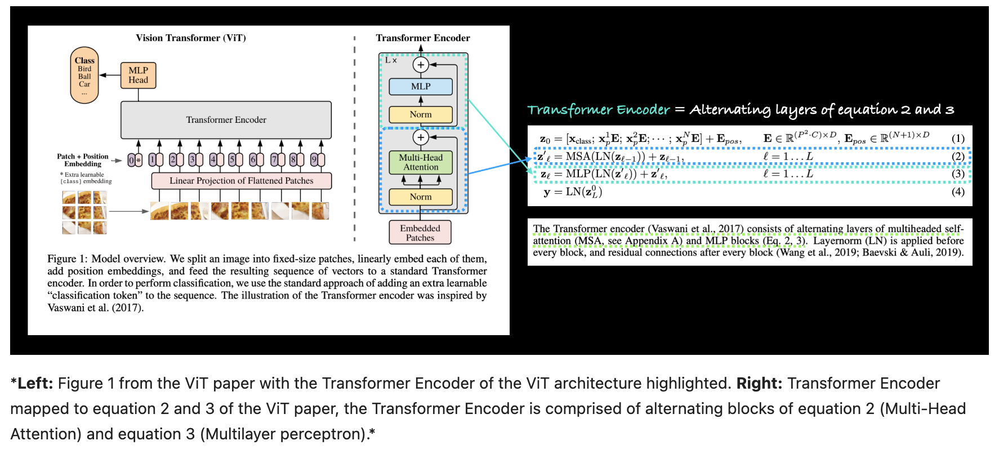

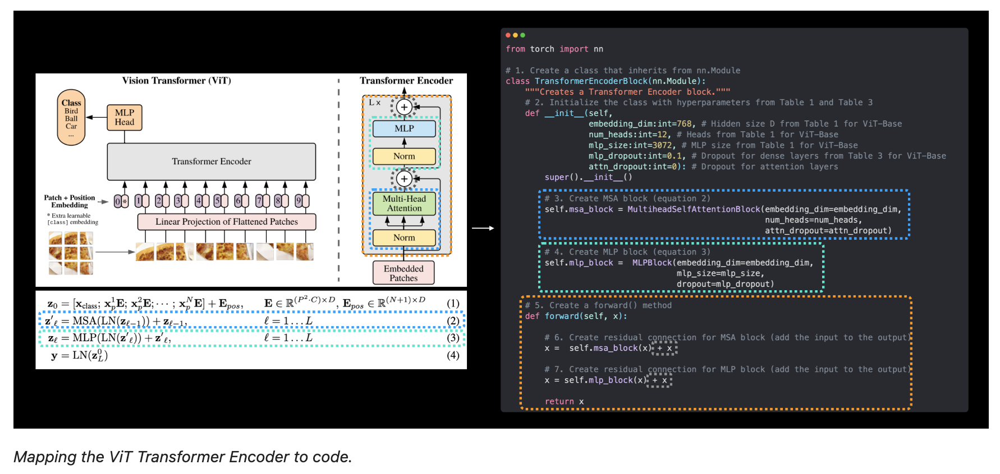

ViT 백서의 표 1에 레이어 열이 있는 것을 보셨을 것입니다.  
이는 특정 ViT 아키텍처에 포함된 트랜스포머 인코더 블록의 수를 나타냅니다.

ViT-Base의 경우 12개의 트랜스포머 인코더 블록을 함께 쌓아 아키텍처의 백본을 구성할 것입니다(이 내용은 8장에서 설명합니다).

shape (1, 197, 768) ->(batch_size, num_patches, embedding_dimension)의 입력을 트랜스포머 인코더 블록에 전달하는 torchinfo.summary() 함수를 가져와 보겠습니다.

In [65]:
# Create an instance of TransformerEncoderBlock
transformer_encoder_block = TransformerEncoderBlock()

# # Print an input and output summary of our Transformer Encoder (uncomment for full output)
summary(model=transformer_encoder_block,
        input_size=(1, 197, 768), # (batch_size, num_patches, embedding_dimension)
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"])

Layer (type (var_name))                            Input Shape          Output Shape         Param #              Trainable
TransformerEncoderBlock (TransformerEncoderBlock)  [1, 197, 768]        [1, 197, 768]        --                   True
├─MultiheadSelfAttentionBlock (msa_block)          [1, 197, 768]        [1, 197, 768]        --                   True
│    └─LayerNorm (layer_norm)                      [1, 197, 768]        [1, 197, 768]        1,536                True
│    └─MultiheadAttention (multihead_attn)         --                   [1, 197, 768]        2,362,368            True
├─MLPBlock (mlp_block)                             [1, 197, 768]        [1, 197, 768]        --                   True
│    └─LayerNorm (layer_norm)                      [1, 197, 768]        [1, 197, 768]        1,536                True
│    └─Sequential (mlp)                            [1, 197, 768]        [1, 197, 768]        --                   True
│    │    └─Linear (0)                     

입력이 트랜스포머 인코더 블록의 MSA 블록과 MLP 블록에 있는 다양한 레이어를 모두 통과하면서 모양이 변하다가 마지막에 원래 모양으로 돌아가는 것을 볼 수 있습니다.

참고: 트랜스포머 인코더 블록의 입력과 블록의 출력 모양이 같다고 해서 값이 조작되지 않았다는 의미는 아니며, 트랜스포머 인코더 블록의 전체 목표는 그 사이에 있는 다양한 레이어를 사용하여 입력의 심층 표현을 학습하는 것입니다(그리고 함께 쌓아 올리는 것입니다).

7.2 Creating a Transformer Encoder with PyTorch's Transformer layers

지금까지 우리는 트랜스포머 인코더 레이어의 구성 요소와 레이어 자체를 직접 구축했습니다.

그러나 인기와 효율성이 높아짐에 따라 이제 파이토치에는 torch.nn의 일부로 트랜스포머 레이어가 내장되어 있습니다.

예를 들어, 방금 생성한 트랜스포머 인코더 블록을 torch.nn.TransformerEncoderLayer()를 사용하여 위와 동일한 하이퍼파라미터를 설정하여 다시 생성할 수 있습니다.

In [66]:
# Create the same as above with torch.nn.TransformerEncoderLayer()
torch_transformer_encoder_layer = nn.TransformerEncoderLayer(d_model=768, # Hidden size D from Table 1 for ViT-Base
                                                             nhead=12, # Heads from Table 1 for ViT-Base
                                                             dim_feedforward=3072, # MLP size from Table 1 for ViT-Base
                                                             dropout=0.1, # Amount of dropout for dense layers from Table 3 for ViT-Base
                                                             activation="gelu", # GELU non-linear activation
                                                             batch_first=True, # Do our batches come first?
                                                             norm_first=True) # Normalize first or after MSA/MLP layers?

torch_transformer_encoder_layer


TransformerEncoderLayer(
  (self_attn): MultiheadAttention(
    (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
  )
  (linear1): Linear(in_features=768, out_features=3072, bias=True)
  (dropout): Dropout(p=0.1, inplace=False)
  (linear2): Linear(in_features=3072, out_features=768, bias=True)
  (norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
  (norm2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
  (dropout1): Dropout(p=0.1, inplace=False)
  (dropout2): Dropout(p=0.1, inplace=False)
)

In [67]:
# Get the output of PyTorch's version of the Transformer Encoder (uncomment for full output)
summary(model=torch_transformer_encoder_layer,
        input_size=(1, 197, 768), # (batch_size, num_patches, embedding_dimension)
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"])

Layer (type (var_name))                            Input Shape          Output Shape         Param #              Trainable
TransformerEncoderLayer (TransformerEncoderLayer)  [1, 197, 768]        [1, 197, 768]        7,087,872            True
Total params: 7,087,872
Trainable params: 7,087,872
Non-trainable params: 0
Total mult-adds (M): 0
Input size (MB): 0.61
Forward/backward pass size (MB): 0.00
Params size (MB): 0.00
Estimated Total Size (MB): 0.61

결과를 보시면 torch.nn.TransformerEncoderLayer()가 레이어를 구성하는 방식 때문에 저희와 약간 다릅니다.  

하지만 사용하는 레이어, 매개변수 수, 입력 및 출력 모양은 동일합니다.   

"파이토치 레이어로 트랜스포머 인코더를 이렇게 빨리 만들 수 있는데 왜 방정식 2와 3을 재현했을까?"라고 생각할 수 있습니다.

답은 바로 연습입니다.   

이제 논문에서 일련의 방정식과 레이어를 복제해 보았으니 레이어를 변경하고 다른 것을 시도해야 한다면 그렇게 하면 됩니다.  

하지만 PyTorch에서 미리 빌드된 레이어를 사용하면 다음과 같은 이점이 있습니다:   

- 오류 발생 가능성 감소 - 일반적으로 레이어가 PyTorch 표준 라이브러리에 포함되면 테스트를 거쳐 작동을 시도한 것입니다.
- 잠재적으로 더 나은 성능 - 2022년 7월 및 PyTorch 1.12 버전부터 PyTorch에서 구현된 torch.nn.TransformerEncoderLayer() 버전은 많은 일반적인 워크로드에서 2배 이상의 속도 향상을 볼 수 있습니다.

ViT 아키텍처는 전체 아키텍처를 위해 여러 개의 트랜스포머 레이어를 겹쳐서 사용하기 때문에(표 1은 ViT-Base의 경우 12개의 레이어를 보여줍니다), 다음과 같이 torch.nn.TransformerEncoder(encoder_layer, num_layers)를 사용할 수 있습니다:

- encoder_layer - torch.nn.TransformerEncoderLayer()로 생성된 대상 트랜스포머 인코더 레이어입니다.
- num_layers - 함께 스택할 트랜스포머 인코더 레이어 수입니다.

### 8. Putting it all together to create ViT

이제 퍼즐의 모든 조각을 맞추는 흥미로운 작업을 할 차례입니다.  

지금까지 만든 모든 블록을 결합하여 전체 ViT 아키텍처를 복제할 것입니다.  

패치와 위치 임베딩부터 트랜스포머 인코더, MLP 헤드까지 말이죠.  

하지만 잠깐만요, 아직 방정식 4를 만들지 않았어요...

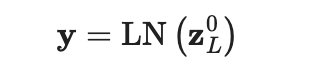

걱정하지 마세요. 방정식 4를 전체 ViT 아키텍처 클래스에 넣으면 됩니다.  

필요한 것은 torch.nn.LayerNorm() 레이어와 torch.nn.Linear() 레이어만 있으면 인코더 로짓 출력의 0번째 인덱스(zL0 )를 트랜스포머 인코더 로짓 출력의 목표 클래스 수로 변환하기만 하면 됩니다.  

전체 아키텍처를 생성하려면 여러 개의 TransformerEncoder블록을 서로 겹쳐서 쌓아야 하는데, 그 목록을 torch.nn.Sequential()에 전달하면 됩니다(이렇게 하면 순차적인 범위의 TransformerEncoder블록이 만들어집니다).  

여기서는 표 1의 ViT-Base 하이퍼파라미터에 초점을 맞추겠지만, 이 코드는 다른 ViT 변형에도 적용할 수 있습니다.  

ViT를 생성하는 것이 가장 큰 코드 블록이 되겠지만, 할 수 있습니다!  

구현 절차는 다음과 같습니다.


1. torch.nn.Module을 상속하는 ViT라는 클래스를 생성합니다.

2. ViT-Base 모델에 대한 ViT 백서의 표 1과 표 3의 하이퍼파라미터를 사용하여 클래스를 초기화합니다.

3. 이미지 크기를 패치 크기로 나눌 수 있는지 확인합니다(이미지가 짝수 패치로 분할되어야 함).

4. N = HW/P^2 공식을 사용하여 패치 수를 계산합니다. 여기서 H는 이미지 높이, W는 이미지 너비, 그리고 P는 패치 크기입니다.

5. 위의 4.6절에서 설명한 대로 학습 가능한 클래스 임베딩 토큰(방정식 1)을 생성합니다.

6. 위의 4.7절에서 설명한 대로 학습 가능한 위치 임베딩 벡터(방정식 1)를 생성합니다.

7. ViT 백서의 부록 B.1에 설명된 대로 임베딩 드롭아웃 레이어를 설정합니다.

8. 4.5절의 패치 임베딩 클래스를 사용하여 패치 임베딩 레이어를 생성합니다.  

9. 섹션 7.1에서 생성한 TransformerEncoderBlocks 목록을 torch.nn.Sequential()에 전달하여 일련의 트랜스포머 인코더 블록을 생성합니다(방정식 2 및 3).

10. torch.nn.LayerNorm()(LN) 레이어와 torch.nn.Linear(out_features=num_classes) 레이어(여기서 num_classes는 목표 클래스 수) 선형 레이어를 torch.nn.Sequential()에 전달하여 MLP 헤드(분류기 헤드 또는 방정식 4라고도 함)를 생성합니다.

11. 입력을 받는 forward() 메서드를 생성합니다.

12. 입력의 배치 크기(도형의 첫 번째 차원)를 가져옵니다.

13. 8단계(방정식 1)에서 생성한 레이어를 사용하여 패치 임베딩을 생성합니다.

14. 5단계에서 생성한 레이어를 사용하여 클래스 토큰 임베딩을 생성하고 torch.Tensor.expand()(방정식 1)를 사용하여 11단계에서 찾은 배치 수만큼 확장합니다.

15. 13단계에서 생성한 클래스 토큰 임베딩을 12단계에서 생성한 패치 임베딩의 첫 번째 차원에 torch.cat()을 사용하여 연결합니다(방정식 1).

16. 단계에서 생성한 위치 임베딩을 14단계에서 생성한 패치 및 클래스 토큰 임베딩에 추가합니다(방정식 1).

17. 7단계에서 생성한 드롭아웃 레이어를 통해 패치와 위치 임베딩을 전달합니다.

18. 16단계의 패치 및 위치 임베딩을 9단계에서 생성한 트랜스포머 인코더 레이어 스택으로 전달합니다(방정식 2 및 3).

19. 17단계의 트랜스포머 인코더 레이어 스택 출력의 인덱스 0을 10단계에서 생성한 분류기 헤드를 통해 전달합니다(방정식 4).

춤추며 우후를 외치세요!!! 방금 비전 트랜스포머를 만들었습니다!